In [1]:
from simtk.openmm import unit

import numpy as np
import os
import pickle

import matplotlib.pyplot as plt

from pymbar import timeseries

from scipy.stats import pearsonr


## Plot correlation between du_dlambda and certain degrees of freedom (aka features)

In [27]:
def plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,  residue_label,
                                           angle=None, res=None, residue_pair=None, is_water=False, 
                                           position_type='old', checkpoint_interval_10=False, figsize=None, 
                                           transform=None, save_path=None):
    """
    Plot timeseries between du/dlambda vs each dof (aka feature) for each replica

    Parameters
    ----------
    out_dir : str
        path to directory containing data to analyze
    sub_dir : str
        path to sub-directory containing data to analyze
    phase : str
        phase (e.g., 'complex')
    replica : int
        replica id
    df : pd.DataFrame
        dataframe containing dof (aka feature) data
    mutation_name : str
        name for the mutation (format: {single letter amino acid for WT}-{residue id}-{single letter aminon acid for mutant})
    residue_label : str
        name of residue to use in the dof label (format: {single letter amino acid}-{residue id})
    angle : str, default None
        dihedral angle name (i.e., 'phi', 'psi', 'chi1', 'chi2', 'chi3', 'chi4')
    res : str, default None
        chain name and residue id (format: {barnase|barstar}-{residue id})
        example: 'barstar-42'
    residue_pair : str, default None
        residue pair name (format: {barnase|barstar}-{residue id} | {barnase|barstar}-{residue id})
        example: 'barstar-42 | barstar-76 new'
    is_water : boolean, default False
        whether the dof to analyze is neighboring waters
    position_type : str, default 'old'
        the type of positions (i.e., 'old' or 'new')
    checkpoint_interval_10 : boolean, default False
        whether the simulation was run with checkpoint interval of 10 
    figsize : tuple of ints, default None
        dimensions to use for generating the figure
    transform : str, default None
        type of transformation to use for the dihedral angles (i.e., 'sin' or 'cos')
        If None is specified, the sine transformation will be used
    save_path : str
        filepath at which to save the figure
    """
    
    # Create figure and axis objects
    if not figsize:
        figsize = (8, 4)
    fig, ax = plt.subplots(nrows=1, ncols=1, sharex='col', figsize=figsize)
    ax2 = ax.twinx()
    
    # Set font size
    plt.rc('font', size=20) 
    
    
    
    ## du/dlambda ##
    
    # Load du_dlambda
    with open(os.path.join(out_dir, f"{sub_dir}_{phase}_du_dlambda_replica{replica}.npy"), "rb") as f:
        du_dlambda = np.load(f)

    # Convert to kcal/mol and truncate, if necessary
    du_dlambda = [val * unit.kilojoules_per_mole.conversion_factor_to(unit.kilocalories_per_mole) for val in du_dlambda]

    if checkpoint_interval_10:
        du_dlambda = du_dlambda[::10]
    
    # Keep only 50 ns
    du_dlambda = du_dlambda[:501]

    # Plot du_dlambda
    x = np.array(list(range(len(du_dlambda))))/10
    ax.scatter(x, du_dlambda, color='#bc80bd', alpha=0.7, label=r'$\partial U / \partial \lambda$')
    
    # Set axis labels
    ax.set_xlabel("t (ns)")
    ax.set_ylabel(r"$\partial U / \partial \lambda$ (kcal/mol)")

    
    
    ## feature #
    
    # Get angle values
    if angle and res:
        data = df[df["replica"] == replica][df["residue"] == res][f"{angle}_{position_type}"].values
        if transform == 'sin':
            y = np.sin(data)
        elif transform == 'cos':
            y = np.cos(data)
        else:
            transform = 'sin'
            y = np.sin(data)
        label = f"{transform}({residue_label} {angle} angle)"
    
    # Get distance values
    elif residue_pair:
        y = df[residue_pair].values*10
        label = f"{residue_label} distance ($\AA$)"
    
    # Get water counts
    elif is_water:
        y = df[df["replica"] == replica][f"waters nearby mutating res (radius = 0.5 nm) {position_type}"].values
        label = f"Number of waters within \n5 $\AA$ of {residue_label}"

    if checkpoint_interval_10:
        y = y[::10]
    
    # Keep only 50 ns
    y = y[:501]
        
    # Plot 
    x = np.array(list(range(len(y))))/10
    ax2.scatter(x, y, color='gray', edgecolors='dimgray', alpha=0.7)

    # Set y label
    ax2.set_ylabel(label)
    
    # Set y axis range
    if angle and res:
        ax2.set_ylim([-1.1, 1.1])

    # Ensure x-axis labels are not cut off
    plt.tight_layout()
    
    # Compute pcc
    result = pearsonr(du_dlambda, y) if not np.isnan(y).all() else None

    # Compute du/dlambda g_ts
    g_t_du = round(timeseries.statisticalInefficiency(du_dlambda), 2)
    g_t_cv = round(timeseries.statisticalInefficiency(y), 2)
    
    # Set title
    du_dlambda_regex = r"$\partial U / \partial \lambda$"
    plt.suptitle(f'PCC: {round(result.statistic, 2)}\n{du_dlambda_regex} g(t): {g_t_du}\ndegree of freedom g(t): {g_t_cv}', fontsize=18, y=1.14)
    plt.title(f"{mutation_name} {phase} (replica {replica})", y=1.30)

    # Save plot as pdf
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')
        plt.show()
        plt.clf()
    else:
        plt.show()
    
    return y
    


## Plot degrees of freedom (aka features) for AREX vs AREST

In [31]:
def plot_feature_vs_feature(phase, replica, df_AREX, df_AREST, mutation_name, residue_label,
                            g_t_AREX_all, g_t_AREST_all, angle=None, res=None, residue_pair=None, is_water=None, 
                            position_type='old', checkpoint_interval_10=False, figsize=None, transform=None, 
                            save_path=None):
    """
    Plot timeseries between du/dlambda vs each dof (aka feature) for each replica

    Parameters
    ----------
    phase : str
        phase (e.g., 'complex')
    replica : int
        replica id
    df_AREX : pd.DataFrame
        dataframe containing dof (aka feature) data from AREX simulation
    df_AREST : pd.DataFrame
        dataframe containing dof (aka feature) data from AREST simulation
    mutation_name : str
        name for the mutation (format: {single letter amino acid for WT}-{residue id}-{single letter aminon acid for mutant})
    residue_label : str
        name of residue to use in the dof label (format: {single letter amino acid}-{residue id})
    g_t_AREX_all : float
        statistical inefficiency of dof across all replicas for AREX simulation
    g_t_AREST_all : float
        statistical inefficiency of dof across all replicas for AREST simulation
    angle : str, default None
        dihedral angle name (i.e., 'phi', 'psi', 'chi1', 'chi2', 'chi3', 'chi4')
    res : str, default None
        chain name and residue id (format: {barnase|barstar}-{residue id})
        example: 'barstar-42'
    residue_pair : str, default None
        residue pair name (format: {barnase|barstar}-{residue id} | {barnase|barstar}-{residue id})
        example: 'barstar-42 | barstar-76 new'
    is_water : boolean, default False
        whether the dof to analyze is neighboring waters
    position_type : str, default 'old'
        the type of positions (i.e., 'old' or 'new')
    checkpoint_interval_10 : boolean, default False
        whether the simulation was run with checkpoint interval of 10 
    figsize : tuple of ints, default None
        dimensions to use for generating the figure
    transform : str, default None
        type of transformation to use for the dihedral angles (i.e., 'sin' or 'cos')
        If None is specified, the sine transformation will be used
    save_path : str
        filepath at which to save the figure
    """
    
    # Create figure and axis objects
    if not figsize:
        figsize = (8, 4)
    fig, ax = plt.subplots(nrows=1, ncols=1, sharex='col', figsize=figsize)
    ax2 = ax.twinx()
    
    # Set font size
    plt.rc('font', size=20) 
    
    ## feature (AREX) #
    
    # Get angle values
    if angle and res:
        data = df_AREX[df_AREX["replica"] == replica][df_AREX["residue"] == res][f"{angle}_{position_type}"].values
        if transform == 'sin':
            y = np.sin(data)
        elif transform == 'cos':
            y = np.cos(data)
        else:
            transform = 'sin'
            y = np.sin(data)
        label = f"{transform}({residue_label} {angle} angle)"
    
    # Get distance values
    elif residue_pair:
        y = df_AREX[residue_pair].values
        label = f"{residue_label} distance (nm)"
    
    # Get water counts
    elif is_water:
        y = df_AREX[df_AREX["replica"] == replica][f"waters nearby mutating res (radius = 0.5 nm) {position_type}"].values
        label = f"Number of waters within \n5 $\AA$ of {residue_label}"

    if checkpoint_interval_10:
        y = y[::10]
    
    # Keep only 50 ns
    y = y[:501]
        
    # Plot 
    x = np.array(list(range(len(y))))/10
    scatter_AREX = ax.scatter(x, y, color="#80b1d3", alpha=0.7, label='AREX')
    
    # Compute AREX collective variable g_t
    g_t_AREX = round(timeseries.statisticalInefficiency(y), 2)
    
    # Set axis labels
    ax.set_xlabel("t (ns)")
    
    ## feature (AREST) #
    
    # Get angle values
    if angle and res:
        data = df_AREST[df_AREST["replica"] == replica][df_AREST["residue"] == res][f"{angle}_{position_type}"].values
        if transform == 'sin':
            y = np.sin(data)
        elif transform == 'cos':
            y = np.cos(data)
        else:
            transform = 'sin'
            y = np.sin(data)
        label = f"{transform}({residue_label} {angle} angle)"
    
    # Get distance values
    elif residue_pair:
        y = df_AREST[residue_pair].values*10
        label = f"{residue_label} distance ($\AA$)"
    
    # Get water counts
    elif is_water:
        y = df_AREST[df_AREST["replica"] == replica][f"waters nearby mutating res (radius = 0.5 nm) {position_type}"].values
        label = f"Number of waters within \n5 $\AA$ of {residue_label}"

    if checkpoint_interval_10:
        y = y[::10]
    
    # Keep only 50 ns
    y = y[:501]
        
    # Plot 
    x = np.array(list(range(len(y))))/10
    scatter_AREST = ax2.scatter(x, y, color="#fdb462", alpha=0.7, label='AREST')

    # Compute AREST collective variable g_t
    g_t_AREST = round(timeseries.statisticalInefficiency(y), 2)
    
    # Set y label
    ax.set_ylabel(label)
    
    # Set y axis range
    if angle and res:
        ax.set_ylim([-1.1, 1.1])
        
    # Hide ticks for second y axis
    ax2.set_yticks([])
    
#     # Add legend
#     scatter_all = [scatter_AREX, scatter_AREST]
#     labels = [s.get_label() for s in scatter_all]
#     ax.legend(scatter_all, labels)
        
    # Ensure x-axis labels are not cut off
    plt.tight_layout()
    
    # Set title
    plt.suptitle(f"""\
                For replica {replica}:             Across all replicas: 
            AREX g(t): {g_t_AREX}        AREX g(t): {g_t_AREX_all}
           AREST g(t): {g_t_AREST}         AREST g(t): {g_t_AREST_all}"""
                 , fontsize=20, x=0.5, y=1.14)
    plt.title(f"{mutation_name} {phase} (replica {replica})", y=1.29)

    # Save plot as pdf
    if save_path:
        plt.savefig(save_path, dpi=500, bbox_inches='tight')
        plt.show()
        plt.clf()
    else:
        plt.show()
    


# A42T 

### barstar-42 chi1 new (AREX)

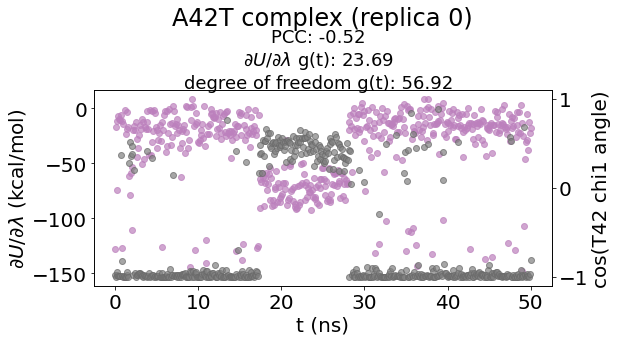

<Figure size 432x288 with 0 Axes>

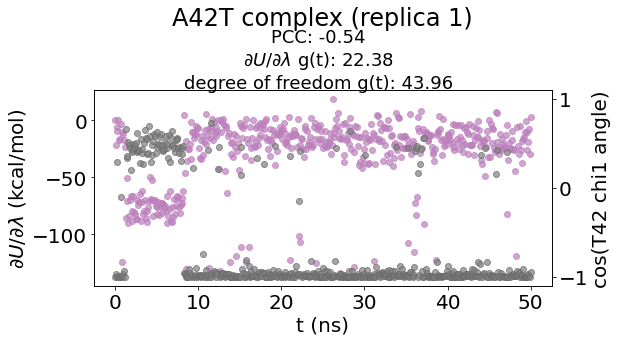

<Figure size 432x288 with 0 Axes>

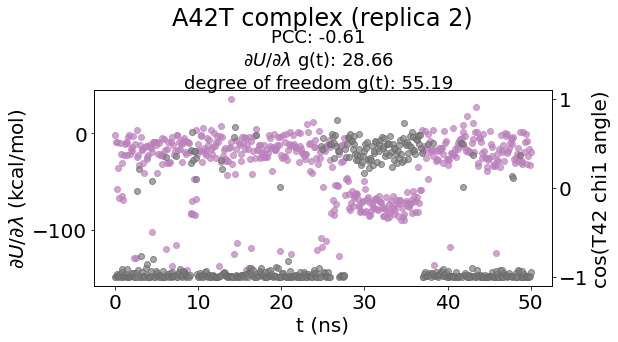

<Figure size 432x288 with 0 Axes>

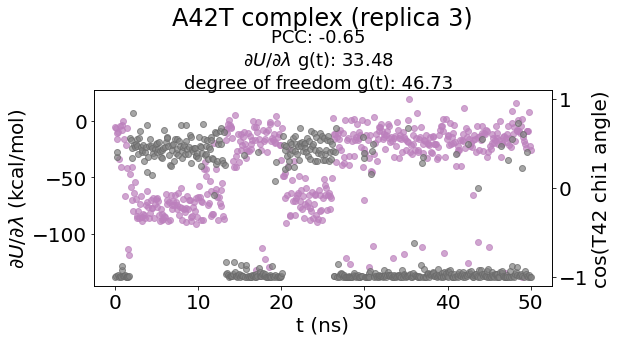

<Figure size 432x288 with 0 Axes>

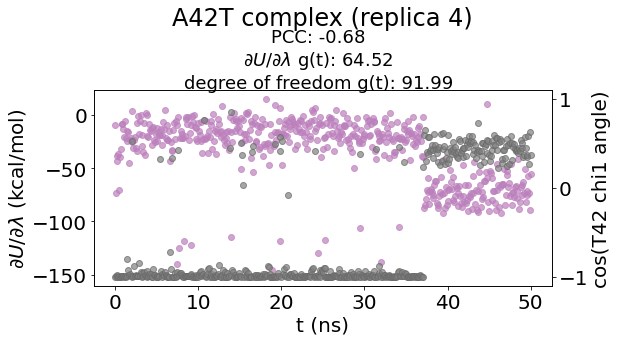

<Figure size 432x288 with 0 Axes>

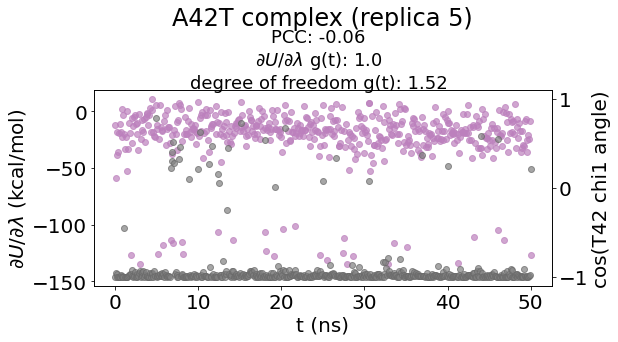

<Figure size 432x288 with 0 Axes>

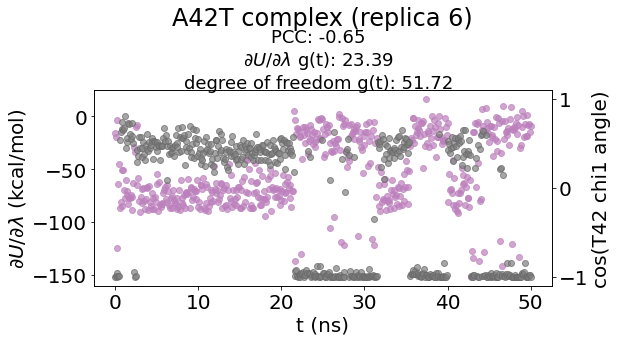

<Figure size 432x288 with 0 Axes>

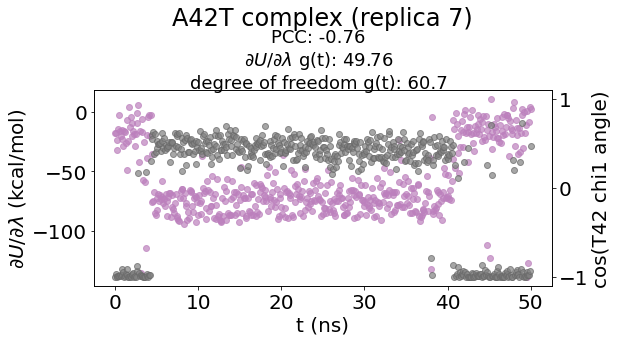

<Figure size 432x288 with 0 Axes>

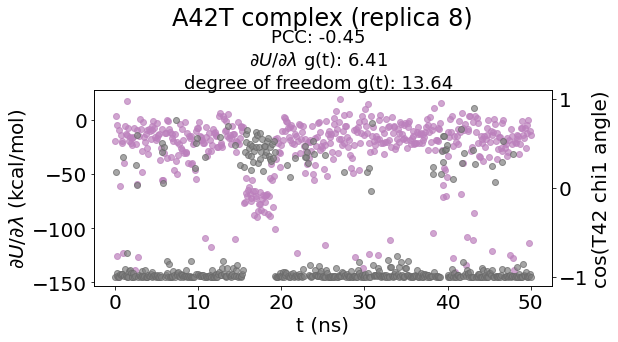

<Figure size 432x288 with 0 Axes>

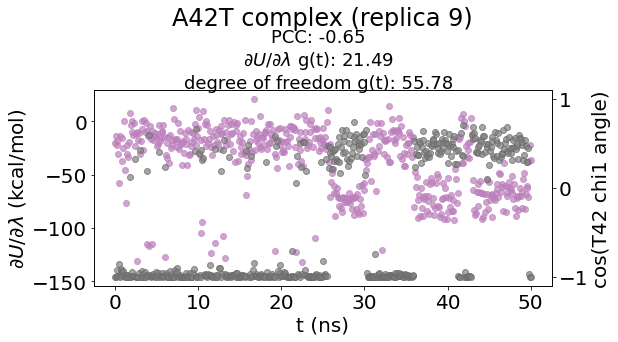

<Figure size 432x288 with 0 Axes>

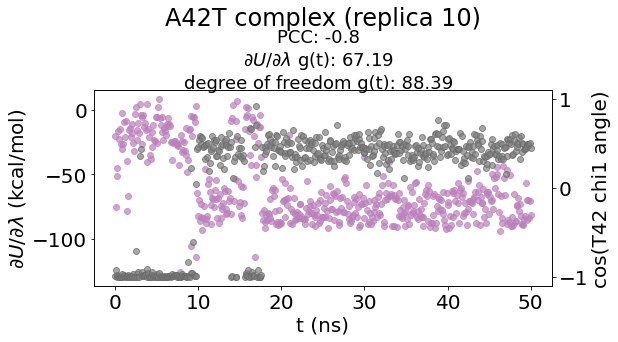

<Figure size 432x288 with 0 Axes>

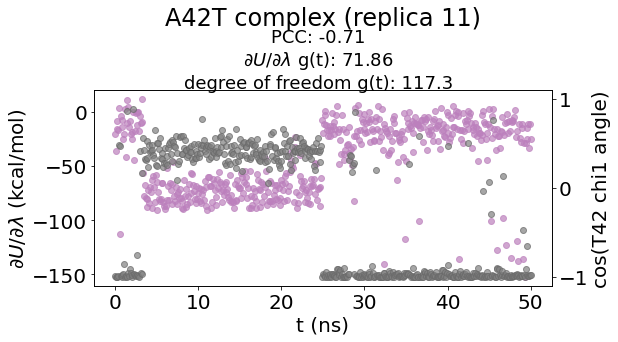

<Figure size 432x288 with 0 Axes>

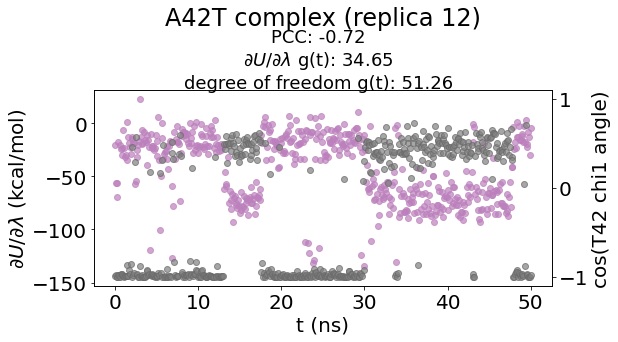

<Figure size 432x288 with 0 Axes>

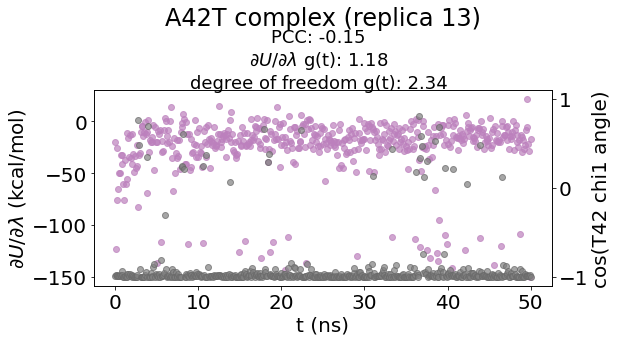

<Figure size 432x288 with 0 Axes>

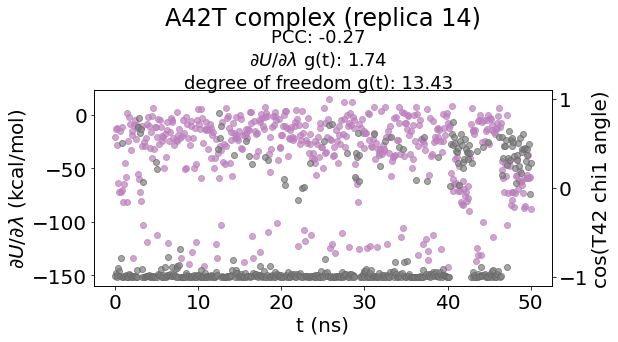

<Figure size 432x288 with 0 Axes>

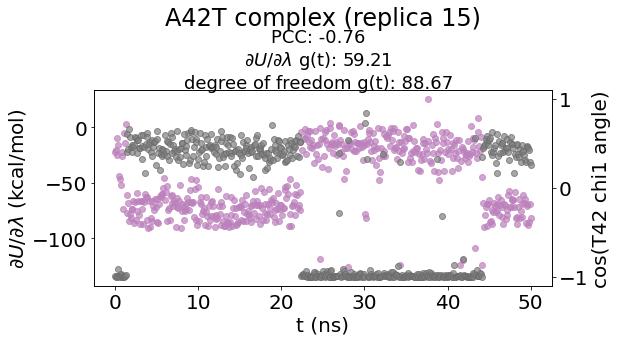

<Figure size 432x288 with 0 Axes>

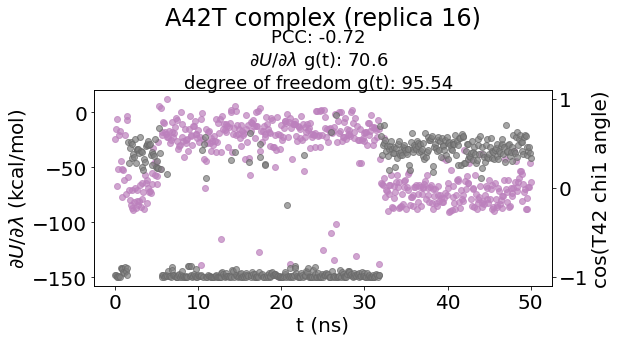

<Figure size 432x288 with 0 Axes>

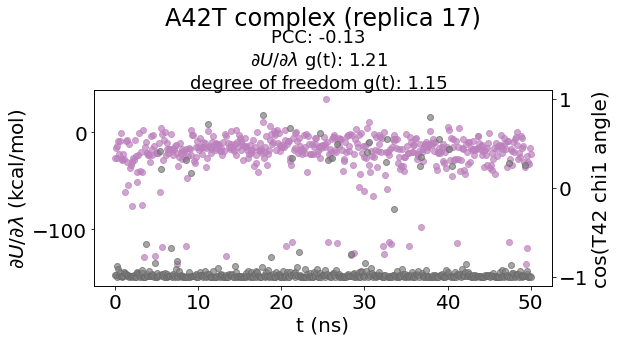

<Figure size 432x288 with 0 Axes>

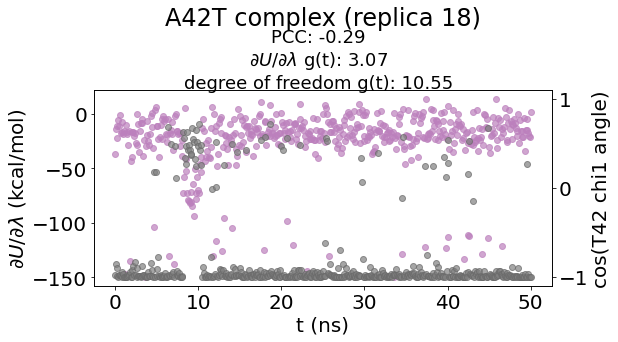

<Figure size 432x288 with 0 Axes>

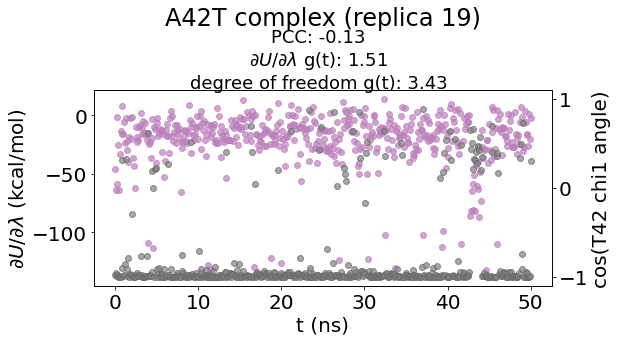

<Figure size 432x288 with 0 Axes>

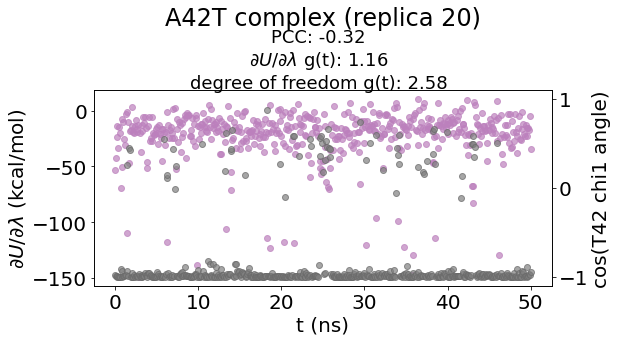

<Figure size 432x288 with 0 Axes>

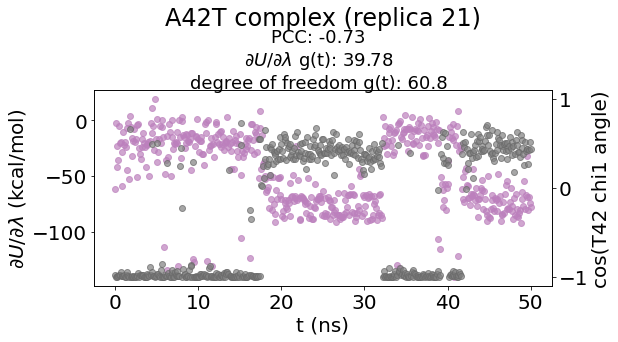

<Figure size 432x288 with 0 Axes>

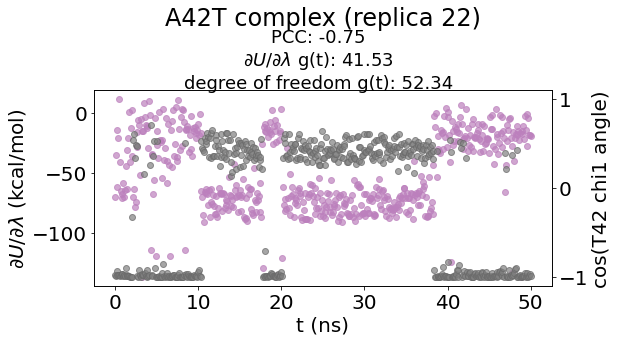

<Figure size 432x288 with 0 Axes>

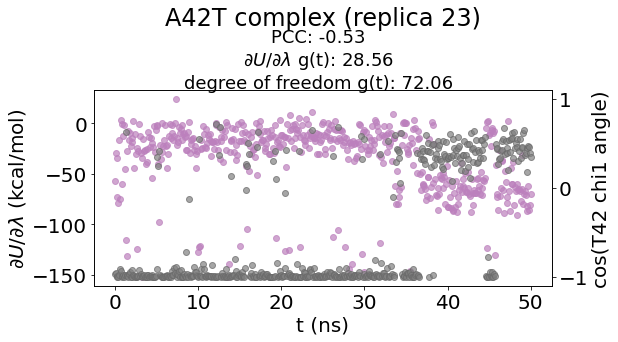

103.84


<Figure size 432x288 with 0 Axes>

In [28]:
# AREX
out_dir = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/45/9/replicate_1/"
sub_dir = 9
phase = "complex"
angle = 'chi1'
res = 'barstar-42'
n_replicas = 24
mutation_name = 'A42T'
position_type = 'new'
residue_label = 'T42'
checkpoint_interval_10 = True
figsize = (9.25, 4)

results = []
for replica in range(n_replicas):

    with open(os.path.join(out_dir, f"dataframe_dihedral_angles_per_replica{replica}.pickle"), "rb") as f:
        df = pickle.load(f)
    
    save_path = os.path.join(out_dir, f"correlation_dihedral_angles_per_replica{replica}.pdf")

    result = plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,
                                           residue_label,
                                           angle=angle, 
                                           res=res, 
                                           position_type=position_type, 
                                           checkpoint_interval_10=checkpoint_interval_10,
                                           figsize=figsize,
                                           transform='cos',  
                                           save_path=save_path)
    results.append(result)

print(round(timeseries.statisticalInefficiencyMultiple(results), 2))

### barstar-42 chi1 new (AREST)

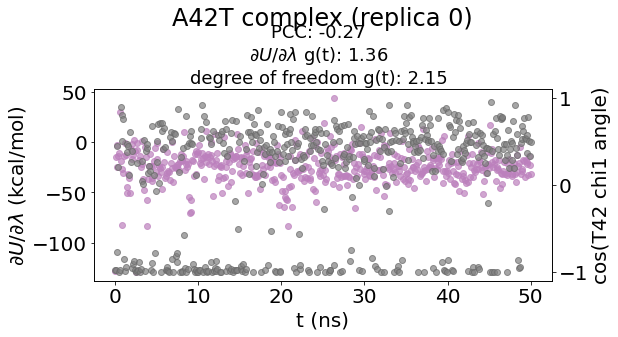

<Figure size 432x288 with 0 Axes>

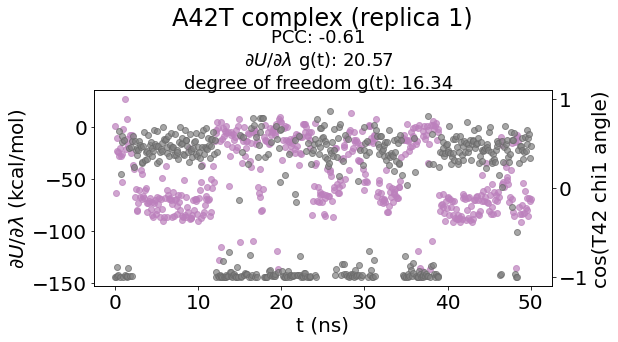

<Figure size 432x288 with 0 Axes>

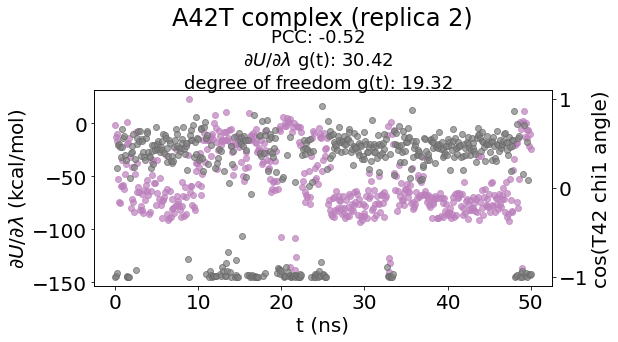

<Figure size 432x288 with 0 Axes>

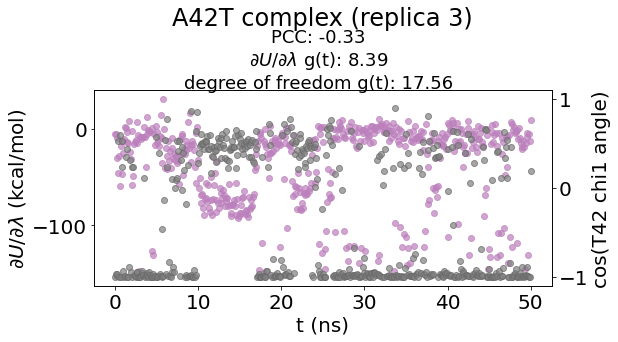

<Figure size 432x288 with 0 Axes>

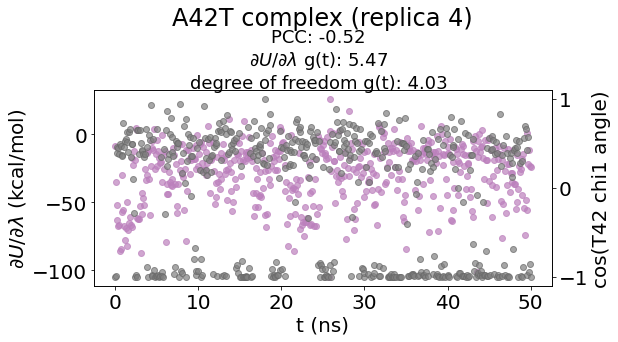

<Figure size 432x288 with 0 Axes>

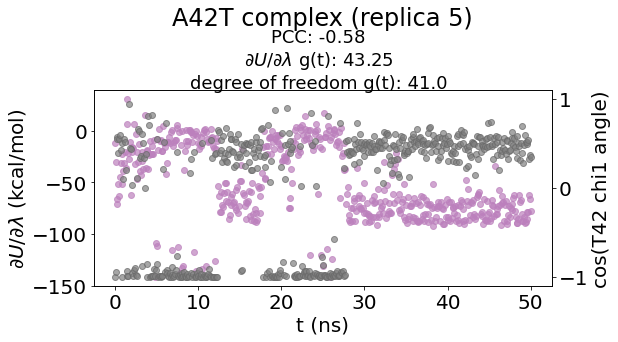

<Figure size 432x288 with 0 Axes>

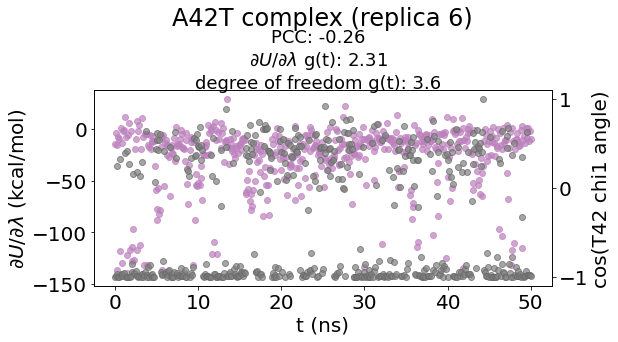

<Figure size 432x288 with 0 Axes>

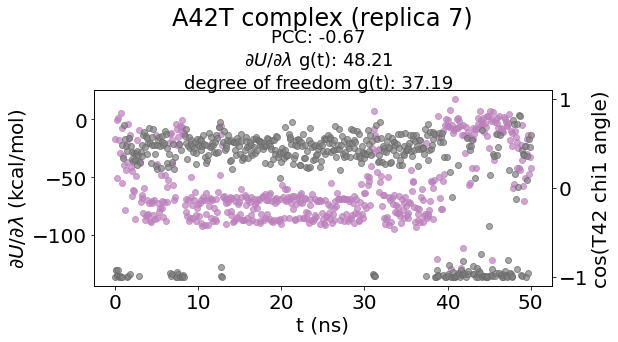

<Figure size 432x288 with 0 Axes>

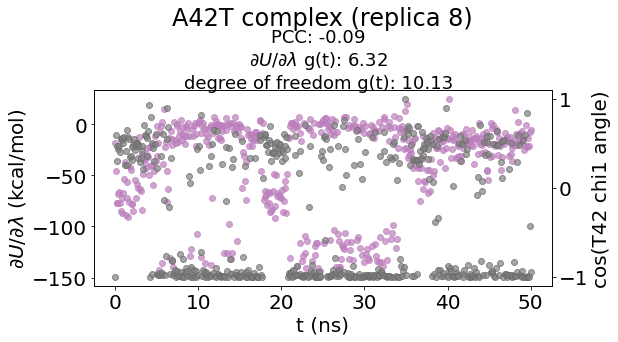

<Figure size 432x288 with 0 Axes>

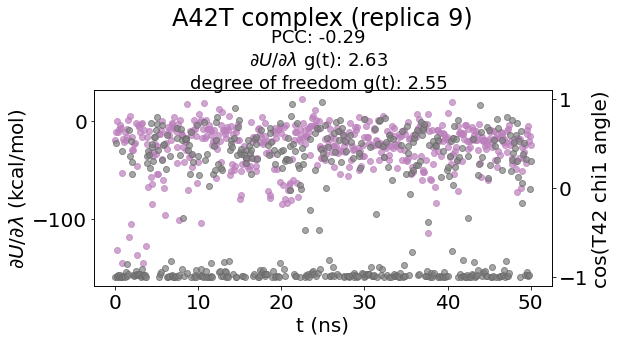

<Figure size 432x288 with 0 Axes>

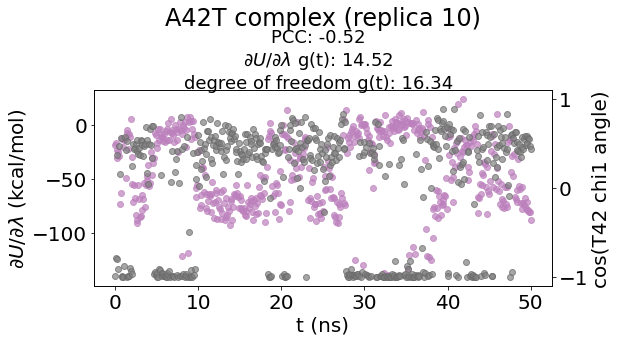

<Figure size 432x288 with 0 Axes>

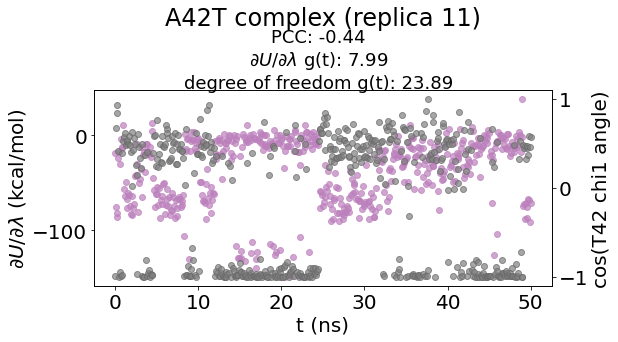

<Figure size 432x288 with 0 Axes>

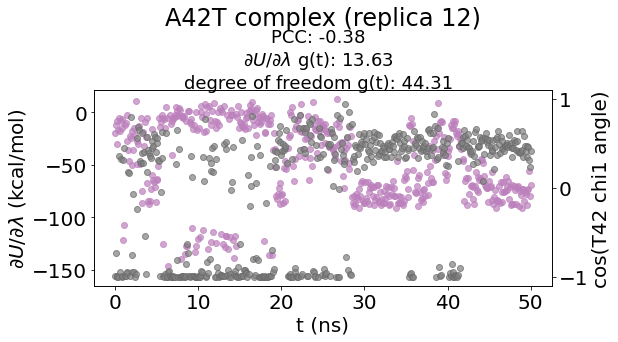

<Figure size 432x288 with 0 Axes>

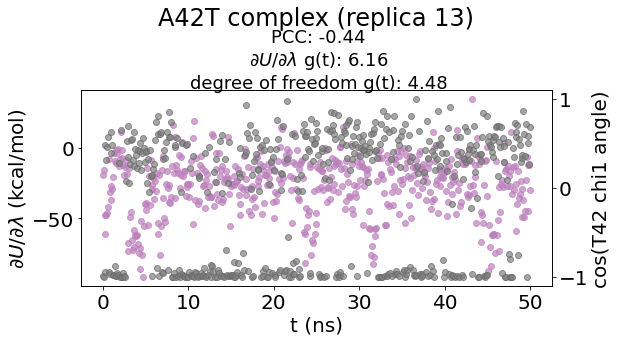

<Figure size 432x288 with 0 Axes>

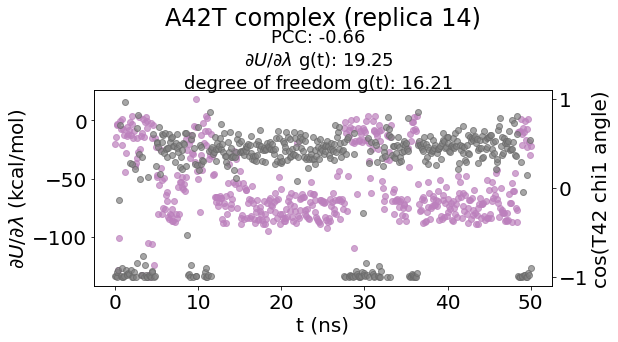

<Figure size 432x288 with 0 Axes>

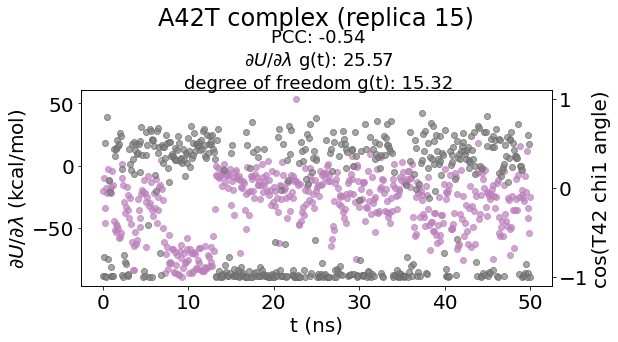

<Figure size 432x288 with 0 Axes>

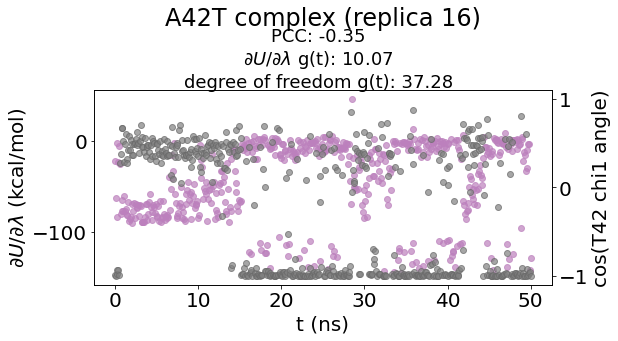

<Figure size 432x288 with 0 Axes>

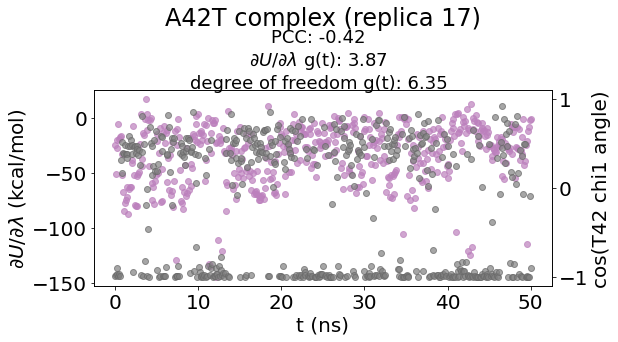

<Figure size 432x288 with 0 Axes>

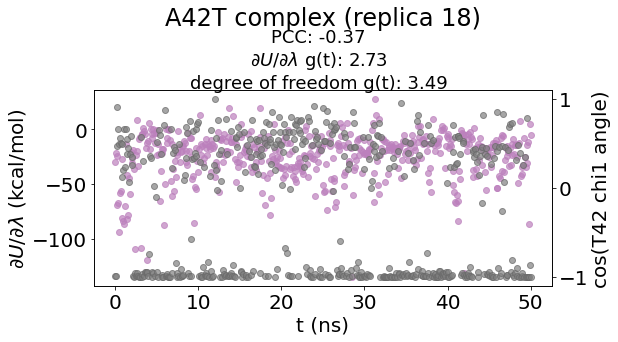

<Figure size 432x288 with 0 Axes>

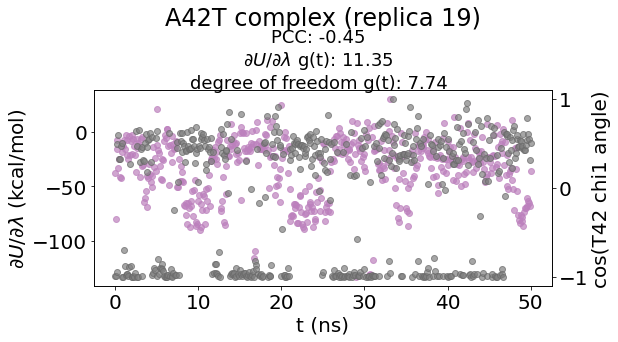

<Figure size 432x288 with 0 Axes>

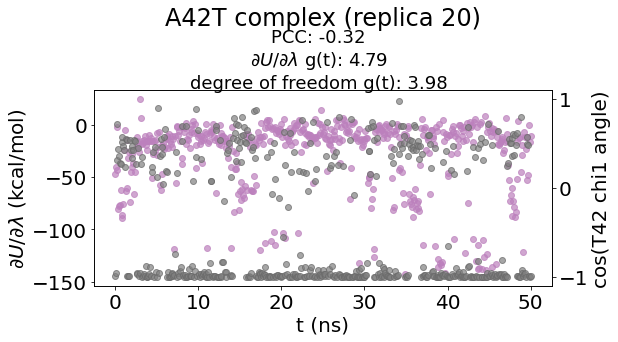

<Figure size 432x288 with 0 Axes>

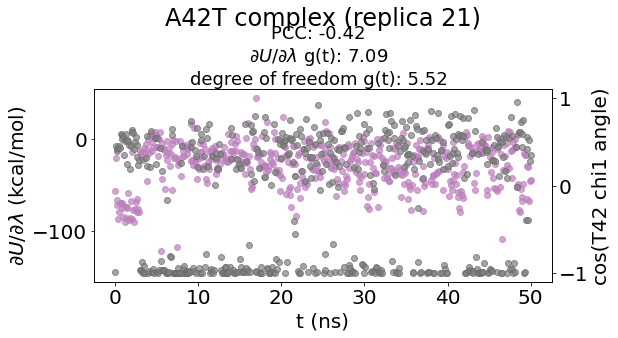

<Figure size 432x288 with 0 Axes>

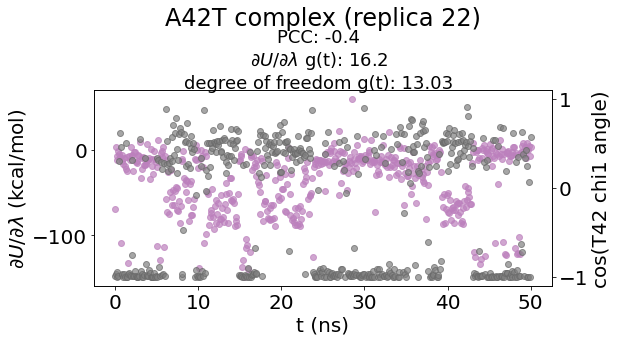

<Figure size 432x288 with 0 Axes>

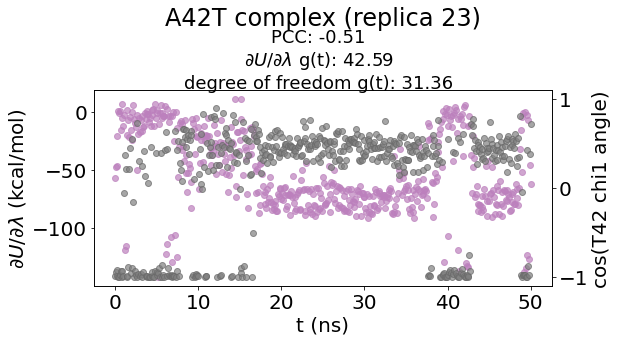

27.3


<Figure size 432x288 with 0 Axes>

In [29]:
# AREST
out_dir = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/52/17/replicate_0/"
sub_dir = 17
phase = "complex"
angle = 'chi1'
res = 'barstar-42'
n_replicas = 24
mutation_name = 'A42T'
position_type = 'new'
residue_label = 'T42'
checkpoint_interval_10 = True
figsize = (9.25, 4)

results = []
for replica in range(n_replicas):

    with open(os.path.join(out_dir, f"dataframe_dihedral_angles_per_replica{replica}.pickle"), "rb") as f:
        df = pickle.load(f)
    
    save_path = os.path.join(out_dir, f"correlation_dihedral_angles_per_replica{replica}.pdf")

    result = plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,
                                           residue_label,
                                           angle=angle, 
                                           res=res, 
                                           position_type=position_type, 
                                           checkpoint_interval_10=checkpoint_interval_10,
                                           figsize=figsize,
                                           transform='cos',
                                           save_path=save_path)
    results.append(result)

print(round(timeseries.statisticalInefficiencyMultiple(results), 2))

### barstar-42 chi1 new (AREX vs AREST)

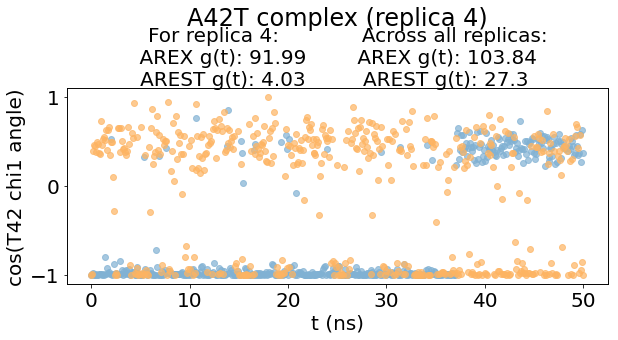

<Figure size 432x288 with 0 Axes>

In [32]:
# AREX vs AREST replica 4
out_dir_AREX = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/45/9/replicate_1/"
out_dir_AREST = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/52/17/replicate_0/"
phase = "complex"
angle = 'chi1'
res = 'barstar-42'
n_replicas = 24
mutation_name = 'A42T'
position_type = 'new'
residue_label = 'T42'
checkpoint_interval_10 = True
figsize = (9.25, 4)

replica = 4

with open(os.path.join(out_dir_AREX, f"dataframe_dihedral_angles_per_replica{replica}.pickle"), "rb") as f:
    df_AREX = pickle.load(f)

with open(os.path.join(out_dir_AREST, f"dataframe_dihedral_angles_per_replica{replica}.pickle"), "rb") as f:
    df_AREST = pickle.load(f)

save_path = os.path.join(out_dir_AREST, f"AREX_vs_AREST_dihedral_angles_per_replica{replica}.pdf")

plot_feature_vs_feature(phase, replica, df_AREX, df_AREST,
                           mutation_name,
                           residue_label,
                           g_t_AREX_all=103.84,
                           g_t_AREST_all=27.3,
                           angle=angle, 
                           res=res, 
                           position_type=position_type, 
                           checkpoint_interval_10=checkpoint_interval_10,
                           figsize=figsize,
                           transform='cos',
                           save_path=save_path)

### barstar-42 | barstar-76 new (AREX)

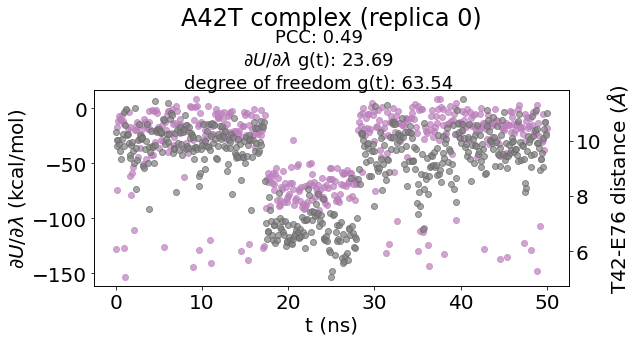

<Figure size 432x288 with 0 Axes>

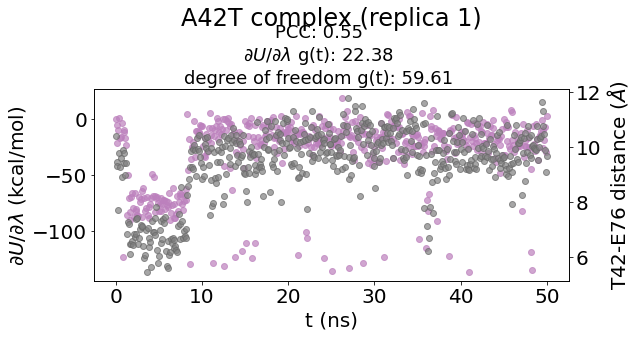

<Figure size 432x288 with 0 Axes>

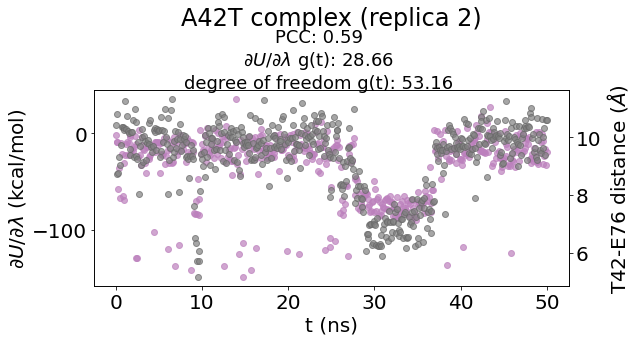

<Figure size 432x288 with 0 Axes>

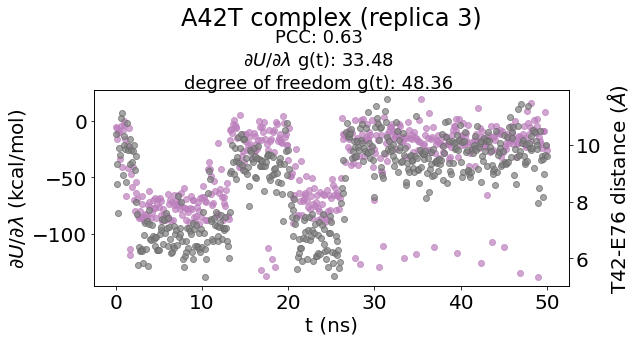

<Figure size 432x288 with 0 Axes>

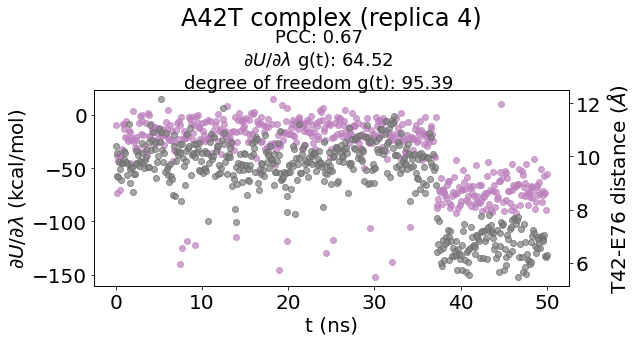

<Figure size 432x288 with 0 Axes>

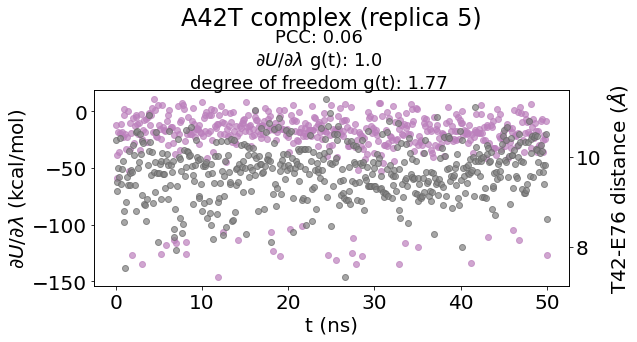

<Figure size 432x288 with 0 Axes>

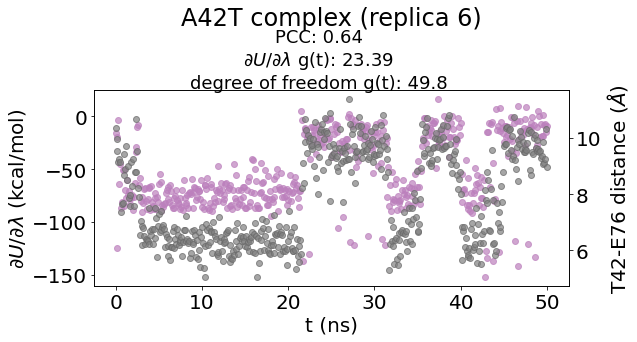

<Figure size 432x288 with 0 Axes>

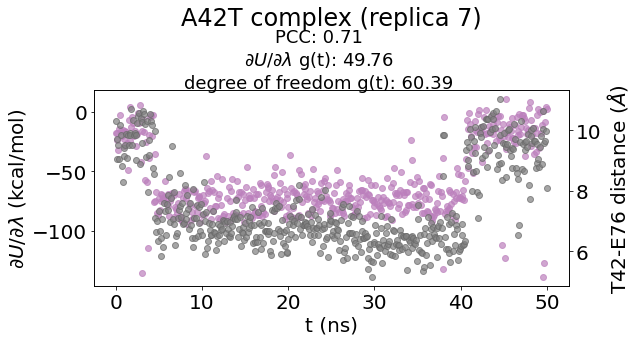

<Figure size 432x288 with 0 Axes>

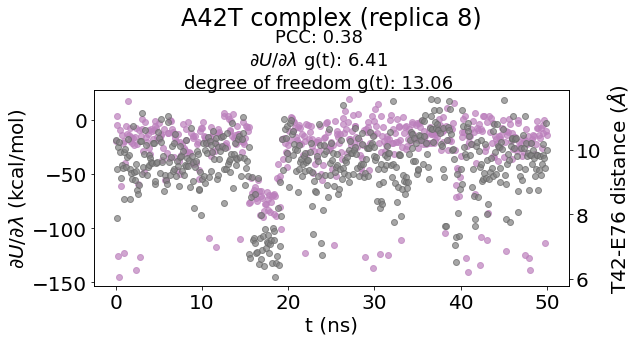

<Figure size 432x288 with 0 Axes>

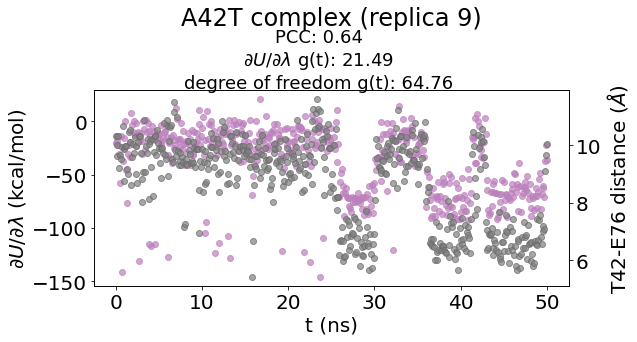

<Figure size 432x288 with 0 Axes>

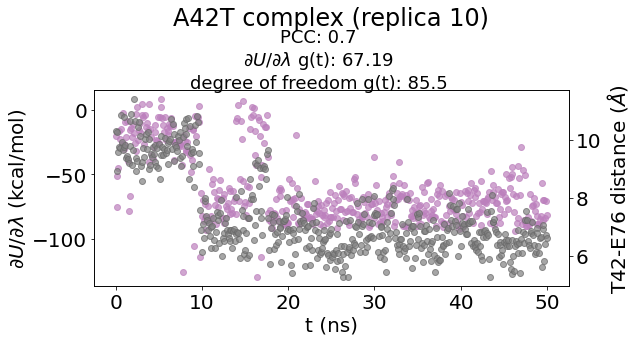

<Figure size 432x288 with 0 Axes>

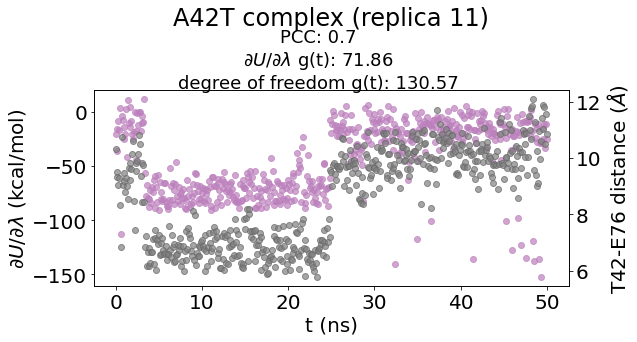

<Figure size 432x288 with 0 Axes>

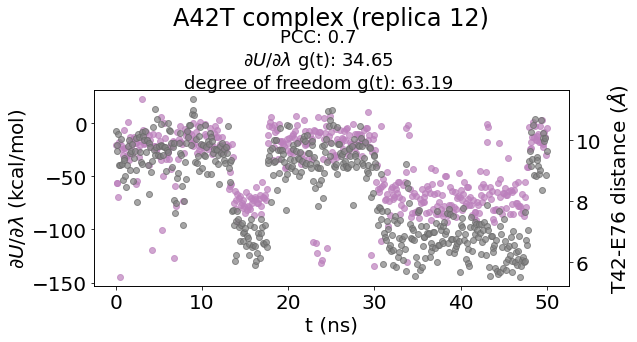

<Figure size 432x288 with 0 Axes>

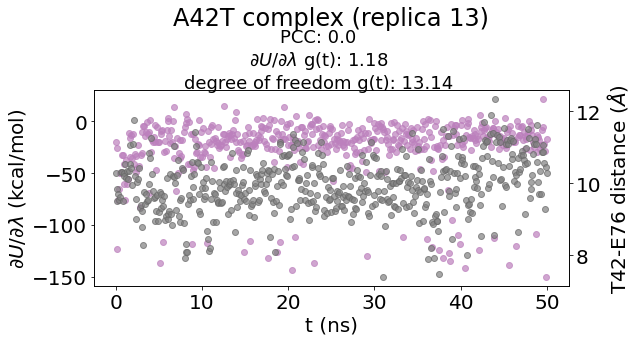

<Figure size 432x288 with 0 Axes>

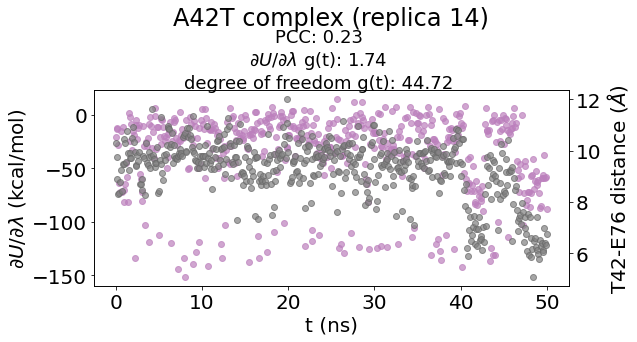

<Figure size 432x288 with 0 Axes>

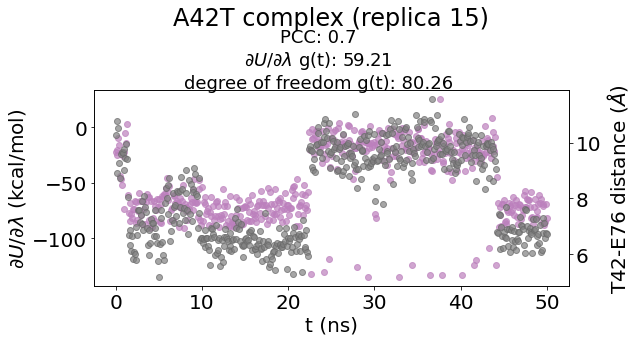

<Figure size 432x288 with 0 Axes>

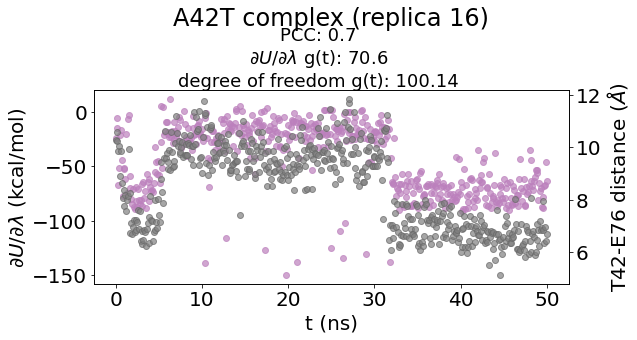

<Figure size 432x288 with 0 Axes>

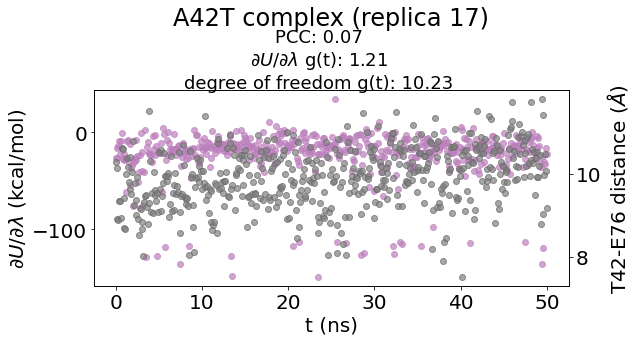

<Figure size 432x288 with 0 Axes>

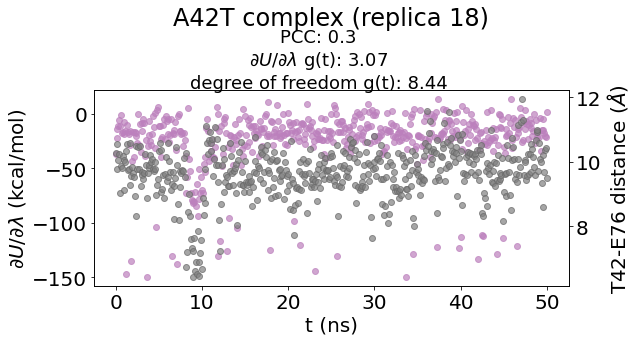

<Figure size 432x288 with 0 Axes>

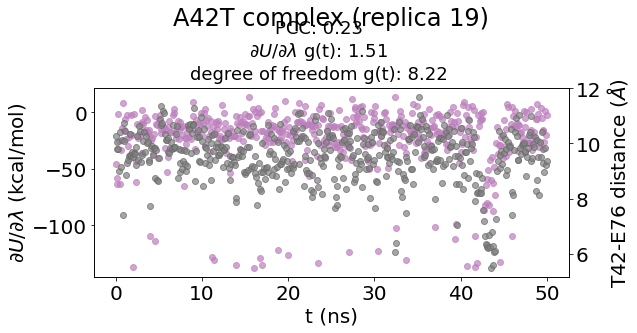

<Figure size 432x288 with 0 Axes>

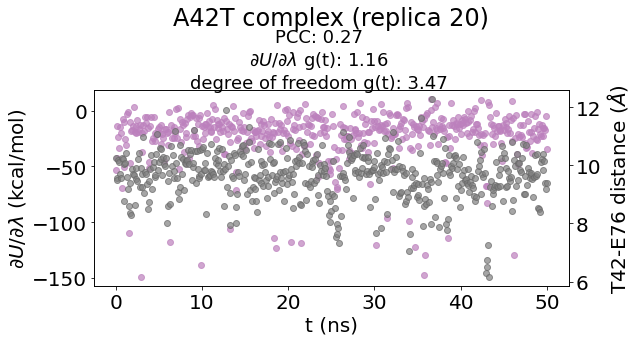

<Figure size 432x288 with 0 Axes>

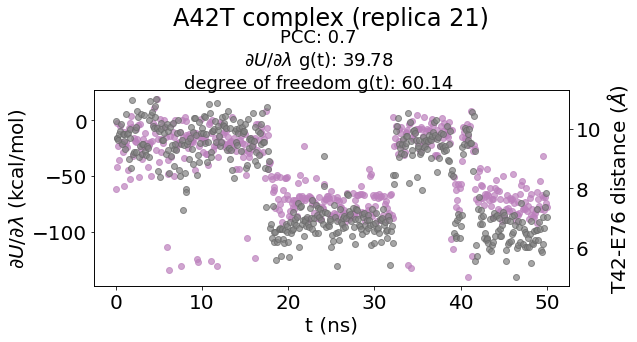

<Figure size 432x288 with 0 Axes>

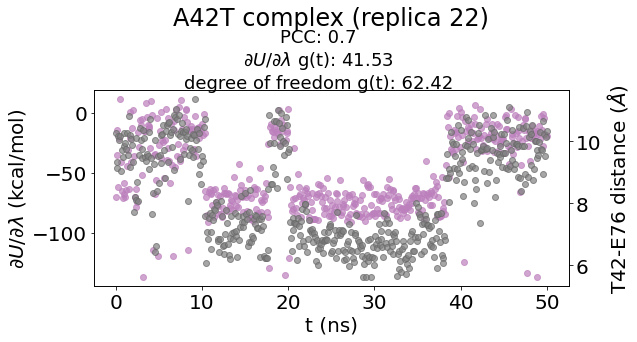

<Figure size 432x288 with 0 Axes>

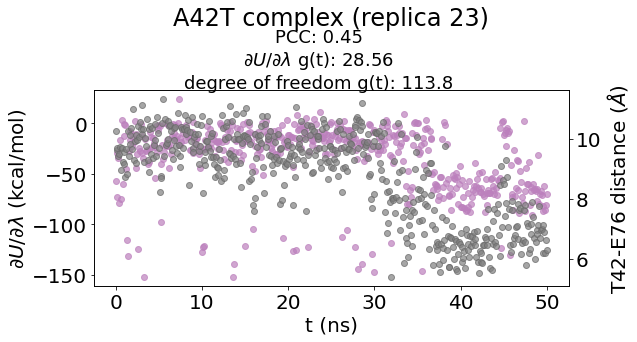

<Figure size 432x288 with 0 Axes>

In [33]:
out_dir = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/45/9/replicate_1/"
sub_dir = 9
phase = "complex"
residue_pair = 'barstar-42 | barstar-76 new'
n_replicas = 24
mutation_name = 'A42T'
position_type = 'new'
residue_label = 'T42-E76'
checkpoint_interval_10 = True
figsize = (9.25, 4)

results = []
for replica in range(n_replicas):
    
    with open(os.path.join(out_dir, f"dataframe_residue_distances_replica{replica}.pickle"), "rb") as f:
        df = pickle.load(f)
    
    save_path = os.path.join(out_dir, f"correlation_residue_distances_per_replica{replica}.pdf")
    
    result = plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,
                                           residue_label,
                                           residue_pair=residue_pair, 
                                           position_type=position_type,
                                           checkpoint_interval_10=checkpoint_interval_10,
                                           figsize=figsize,
                                           save_path=save_path)
    results.append(result)



## R87A

### barnase-87 | barstar-39 old (AREX)

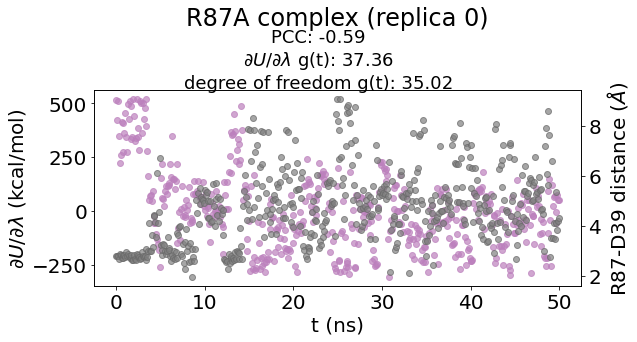

<Figure size 432x288 with 0 Axes>

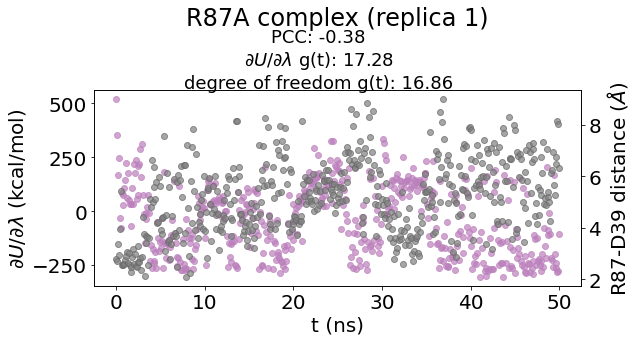

<Figure size 432x288 with 0 Axes>

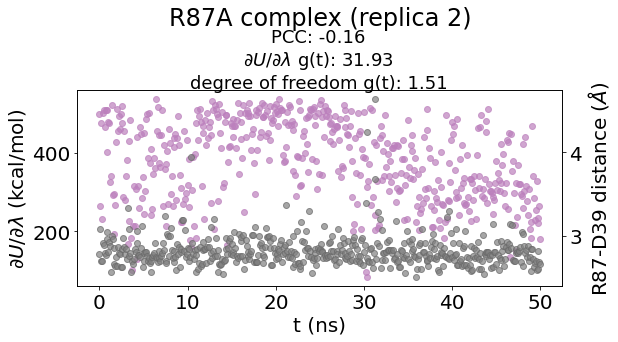

<Figure size 432x288 with 0 Axes>

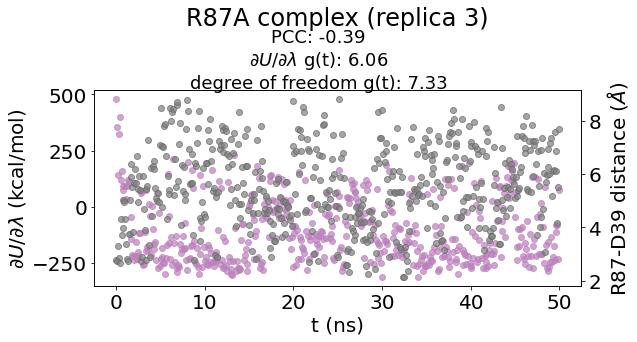

<Figure size 432x288 with 0 Axes>

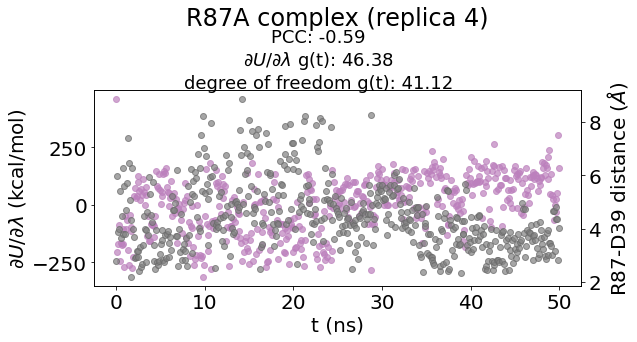

<Figure size 432x288 with 0 Axes>

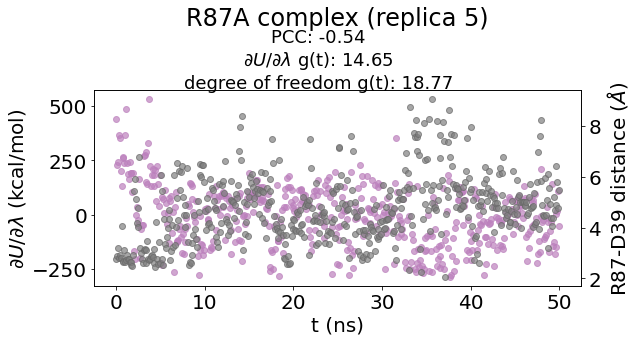

<Figure size 432x288 with 0 Axes>

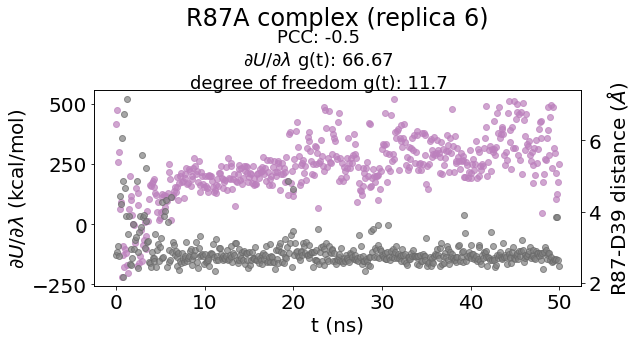

<Figure size 432x288 with 0 Axes>

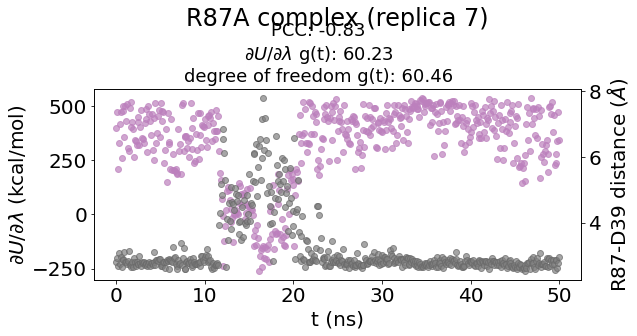

<Figure size 432x288 with 0 Axes>

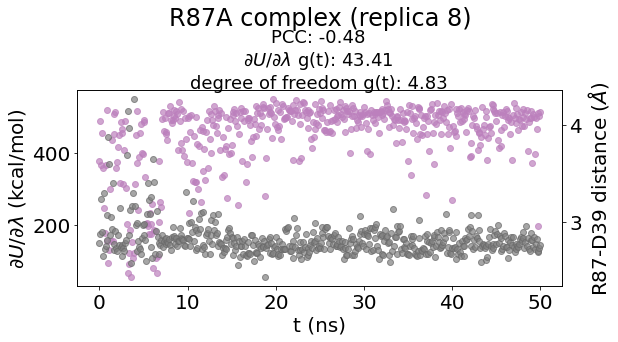

<Figure size 432x288 with 0 Axes>

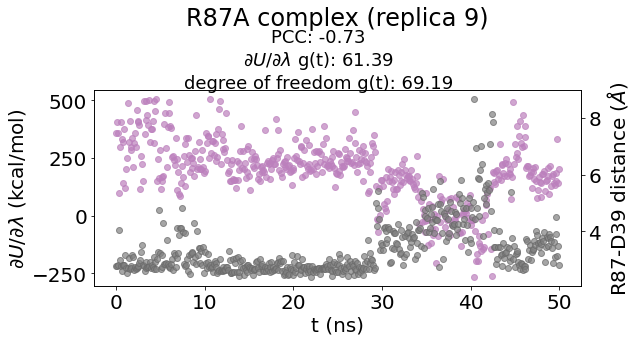

<Figure size 432x288 with 0 Axes>

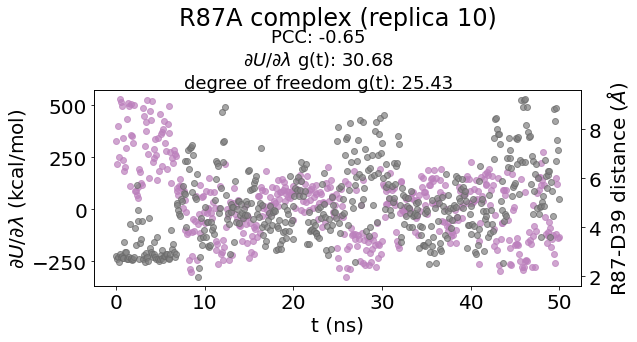

<Figure size 432x288 with 0 Axes>

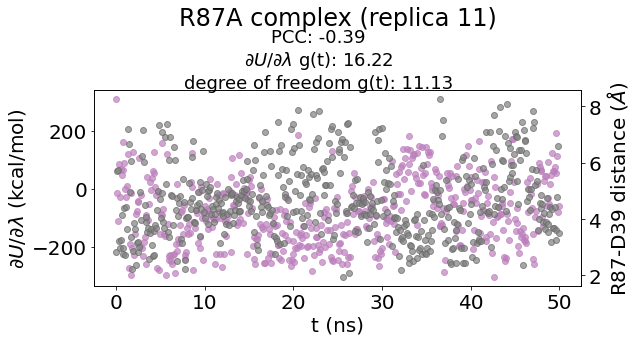

<Figure size 432x288 with 0 Axes>

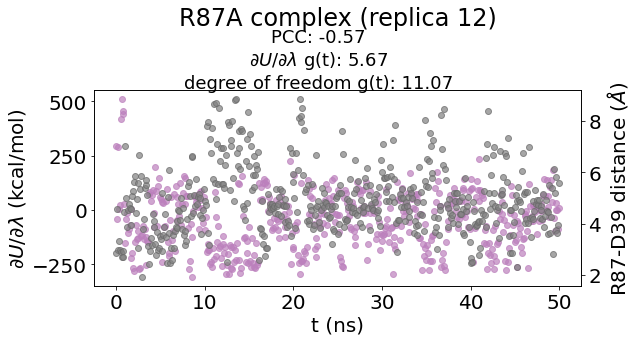

<Figure size 432x288 with 0 Axes>

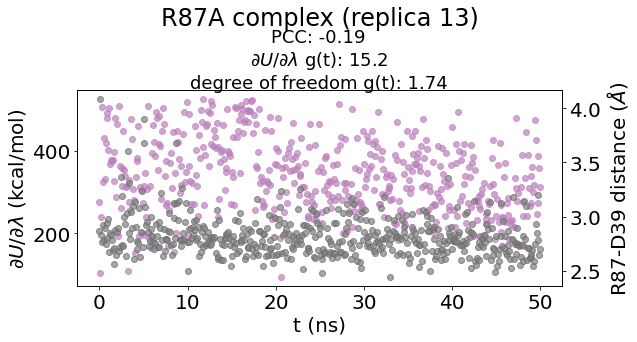

<Figure size 432x288 with 0 Axes>

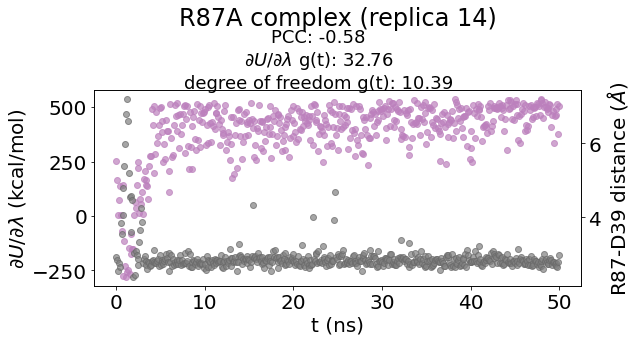

<Figure size 432x288 with 0 Axes>

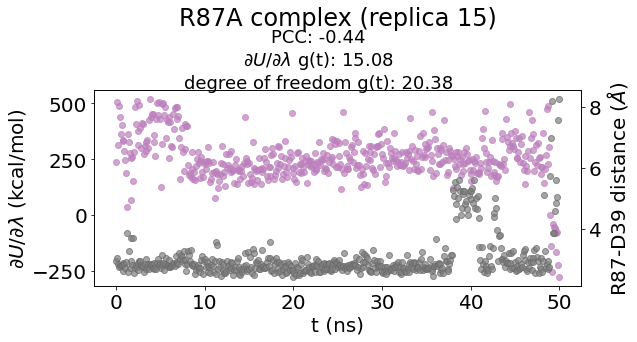

<Figure size 432x288 with 0 Axes>

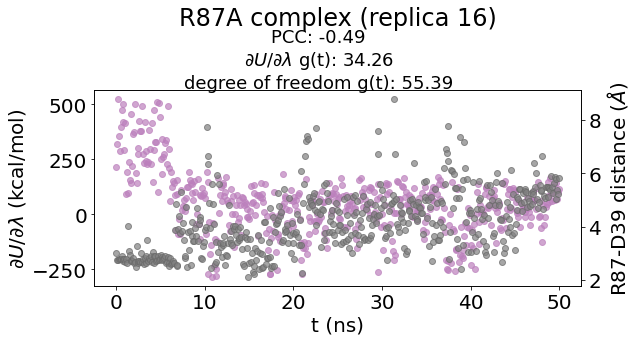

<Figure size 432x288 with 0 Axes>

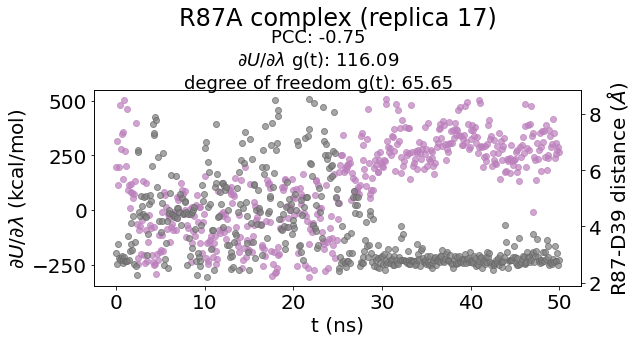

<Figure size 432x288 with 0 Axes>

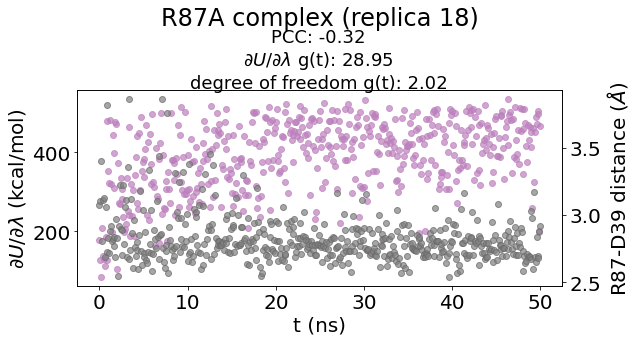

<Figure size 432x288 with 0 Axes>

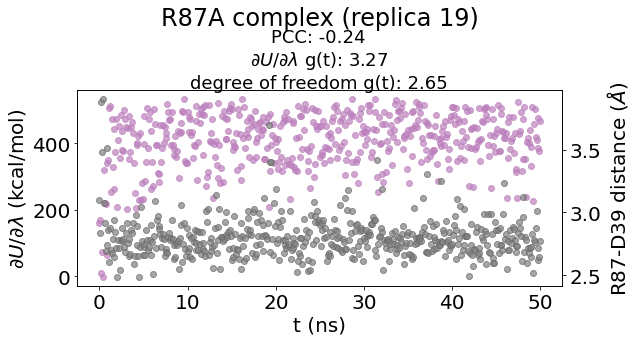

<Figure size 432x288 with 0 Axes>

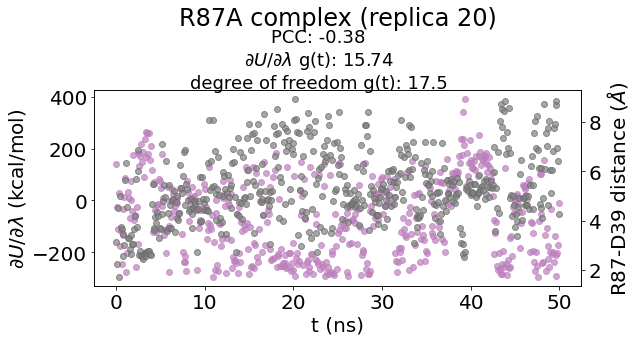

<Figure size 432x288 with 0 Axes>

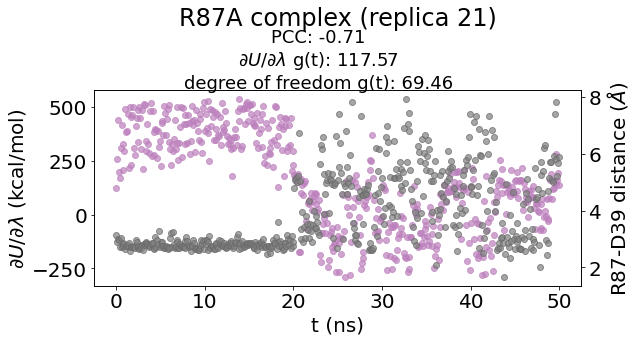

<Figure size 432x288 with 0 Axes>

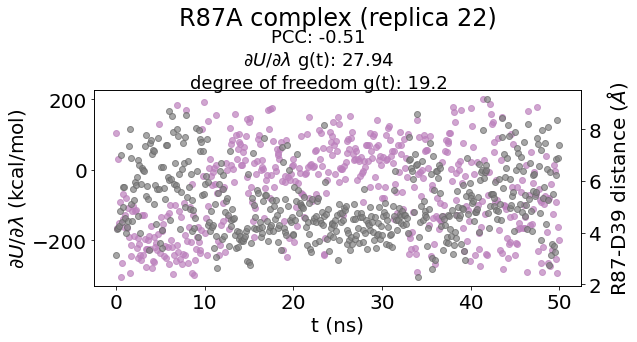

<Figure size 432x288 with 0 Axes>

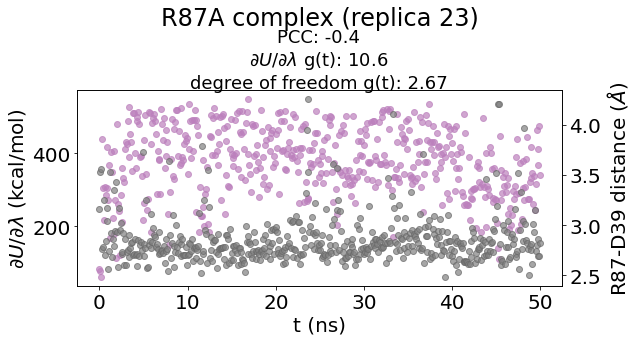

<Figure size 432x288 with 0 Axes>

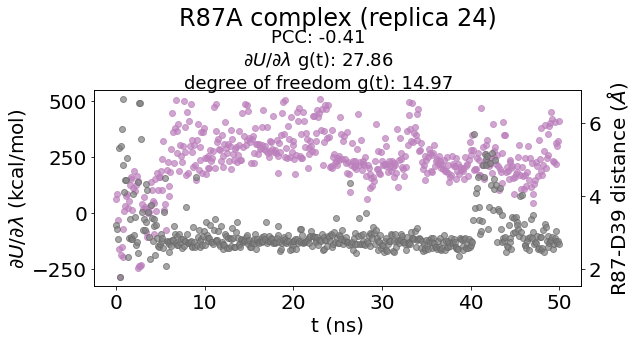

<Figure size 432x288 with 0 Axes>

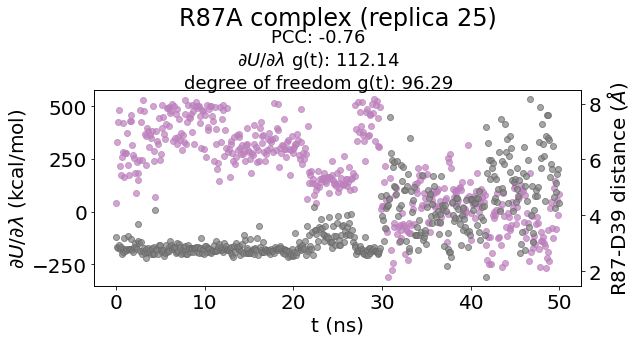

<Figure size 432x288 with 0 Axes>

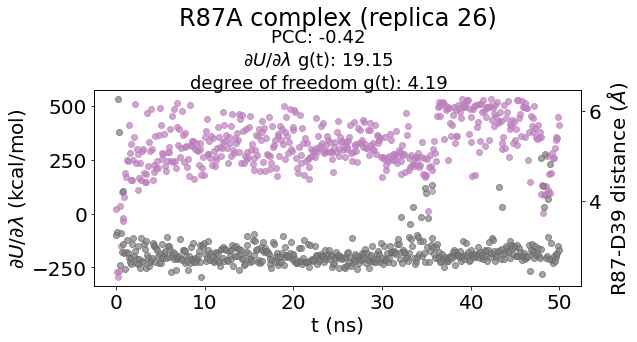

<Figure size 432x288 with 0 Axes>

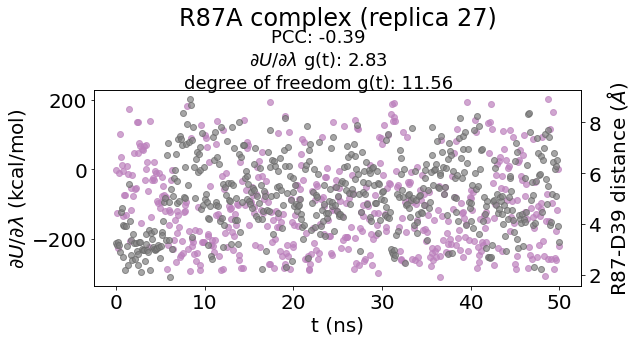

<Figure size 432x288 with 0 Axes>

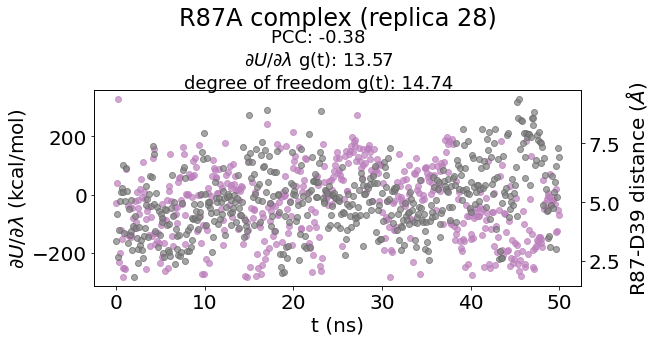

<Figure size 432x288 with 0 Axes>

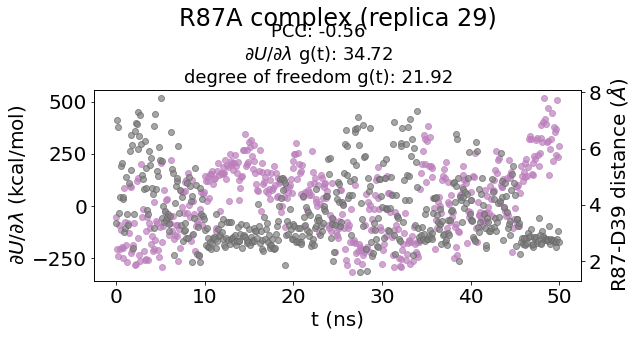

<Figure size 432x288 with 0 Axes>

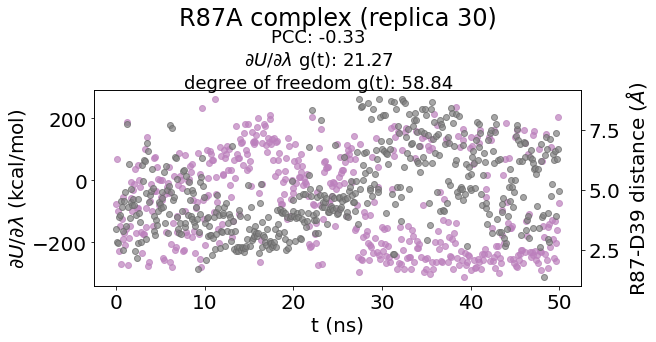

<Figure size 432x288 with 0 Axes>

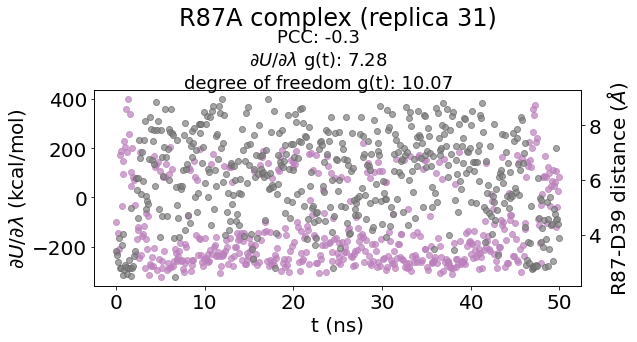

<Figure size 432x288 with 0 Axes>

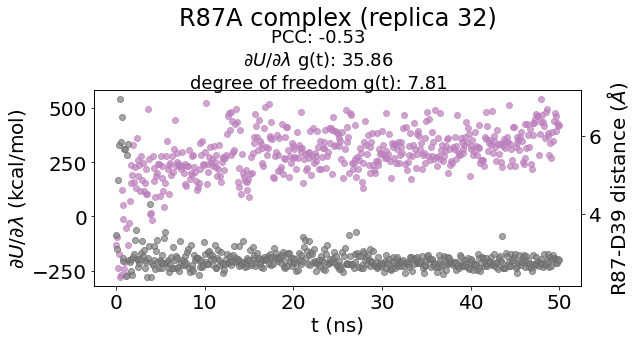

<Figure size 432x288 with 0 Axes>

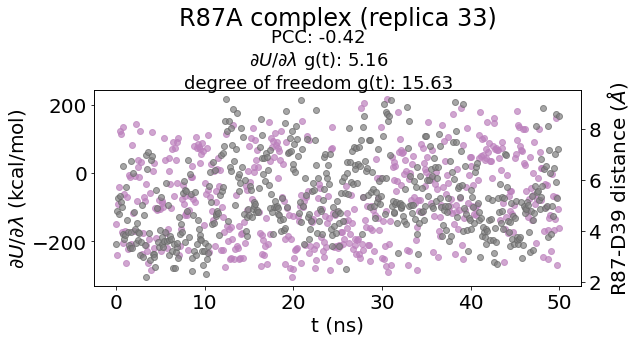

<Figure size 432x288 with 0 Axes>

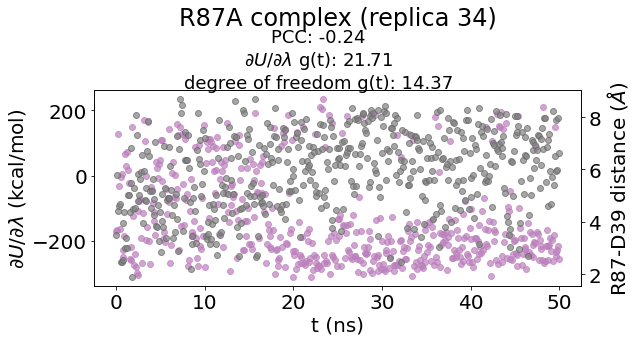

<Figure size 432x288 with 0 Axes>

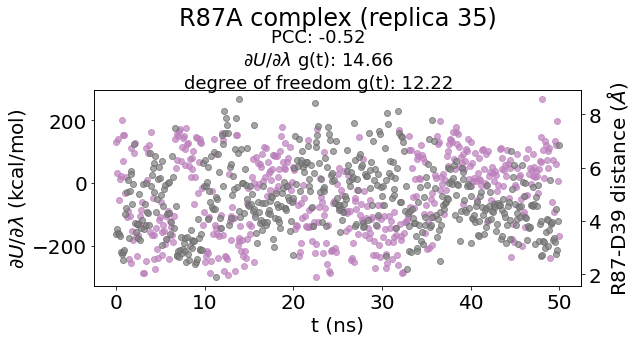

231.34


<Figure size 432x288 with 0 Axes>

In [34]:
# AREX
out_dir = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/45/10/replicate_1/"
sub_dir = 10
phase = "complex"
residue_pair = 'barnase-87 | barstar-39 old'
n_replicas = 36
mutation_name = 'R87A'
position_type = 'old'
residue_label = 'R87-D39'
checkpoint_interval_10 = True
figsize = (9.25, 4)

results = []
for replica in range(n_replicas):
    
    with open(os.path.join(out_dir, f"dataframe_residue_distances_replica{replica}.pickle"), "rb") as f:
        df = pickle.load(f)
    
    save_path = os.path.join(out_dir, f"correlation_residue_distances_per_replica{replica}.pdf")

    result = plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,
                                           residue_label,
                                           residue_pair=residue_pair, 
                                           position_type=position_type,
                                           checkpoint_interval_10=checkpoint_interval_10,
                                           figsize=figsize,
                                           save_path=save_path)
    results.append(result)

print(round(timeseries.statisticalInefficiencyMultiple(results), 2))

### neighboring waters new (AREX)

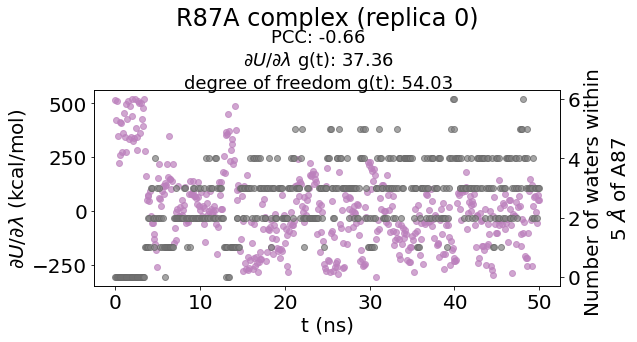

<Figure size 432x288 with 0 Axes>

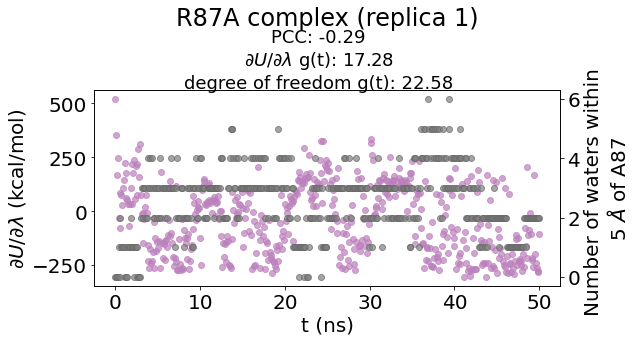

<Figure size 432x288 with 0 Axes>

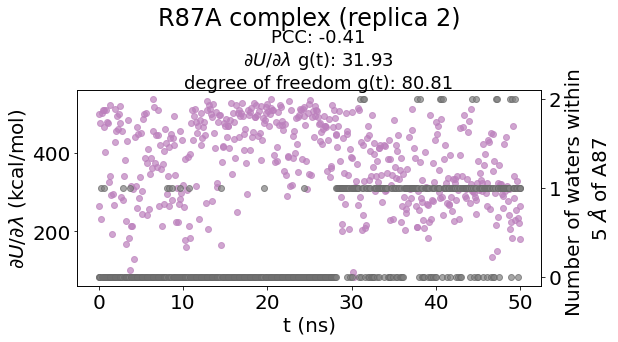

<Figure size 432x288 with 0 Axes>

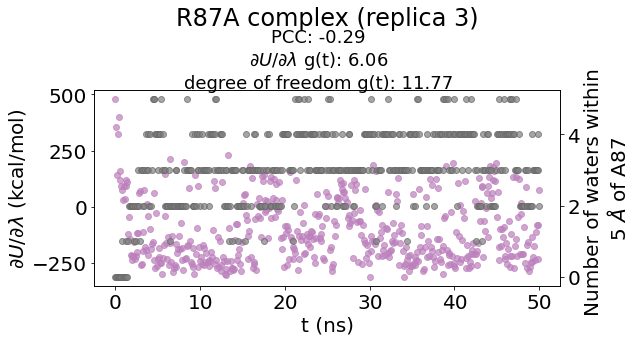

<Figure size 432x288 with 0 Axes>

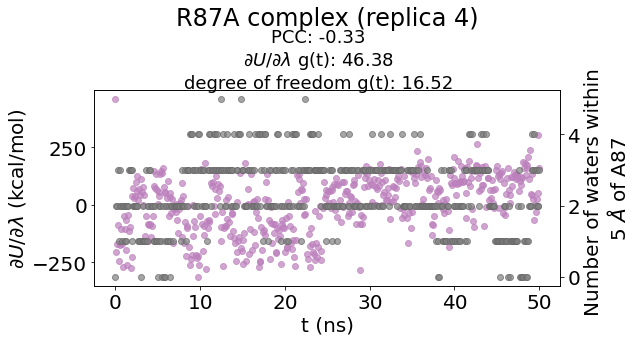

<Figure size 432x288 with 0 Axes>

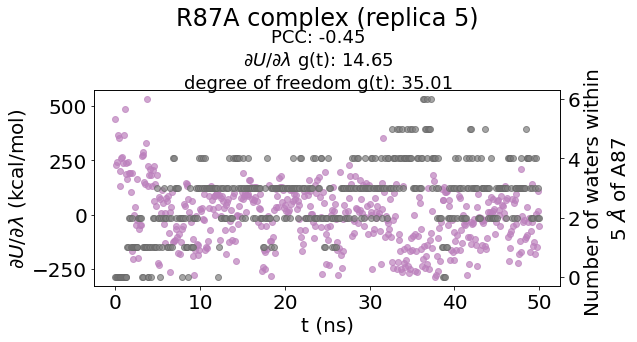

<Figure size 432x288 with 0 Axes>

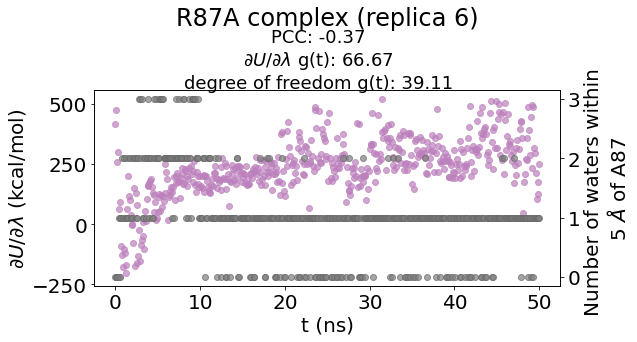

<Figure size 432x288 with 0 Axes>

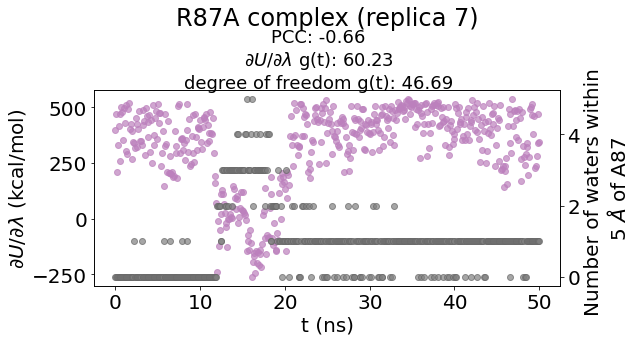

<Figure size 432x288 with 0 Axes>

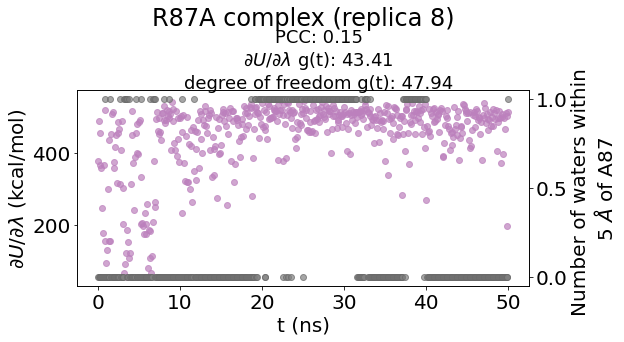

<Figure size 432x288 with 0 Axes>

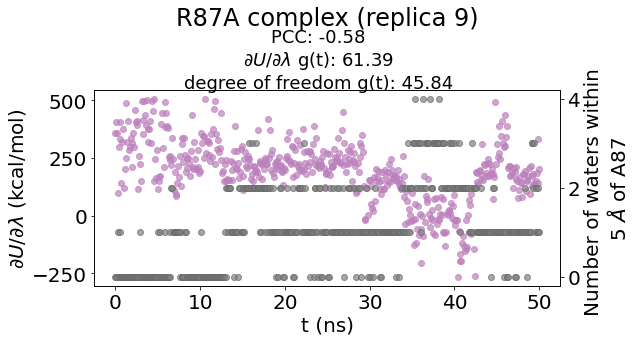

<Figure size 432x288 with 0 Axes>

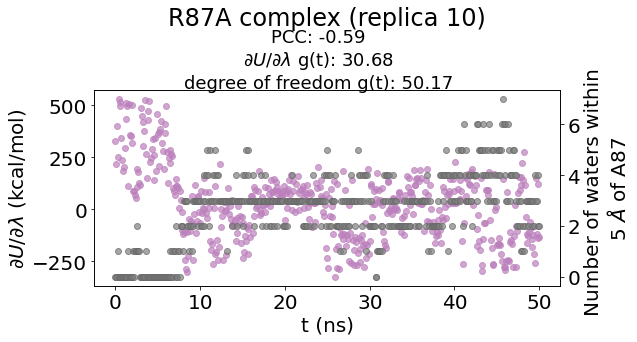

<Figure size 432x288 with 0 Axes>

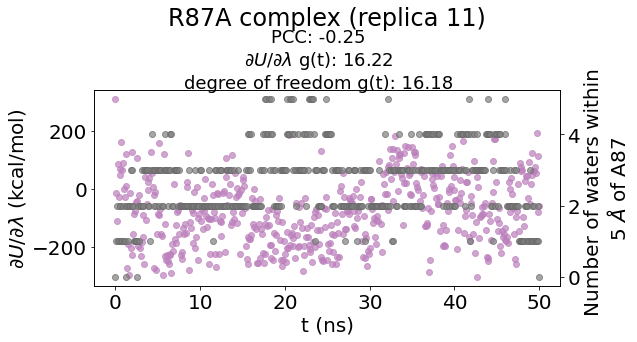

<Figure size 432x288 with 0 Axes>

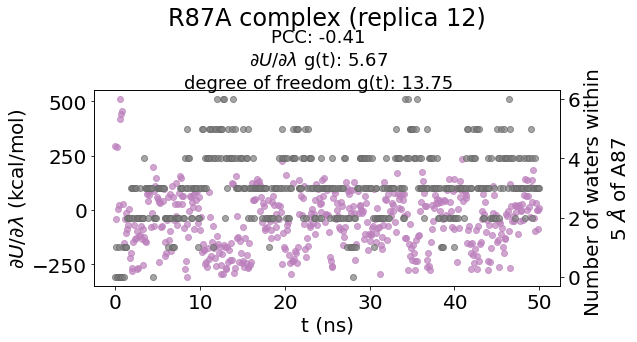

<Figure size 432x288 with 0 Axes>

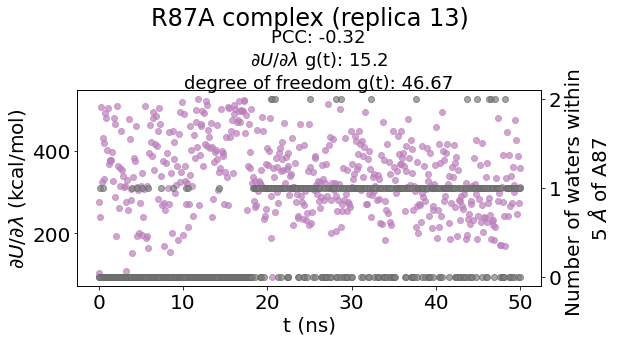

<Figure size 432x288 with 0 Axes>

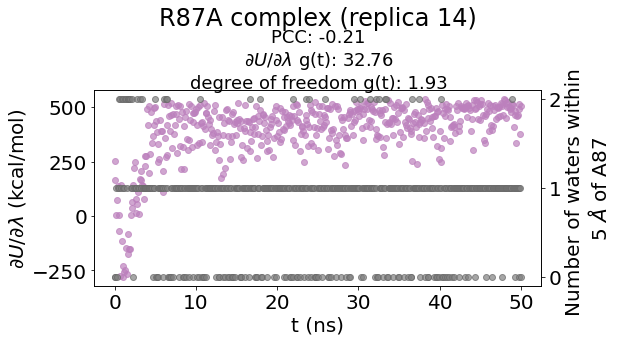

<Figure size 432x288 with 0 Axes>

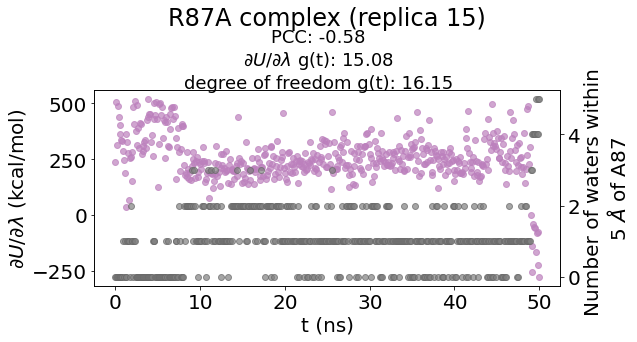

<Figure size 432x288 with 0 Axes>

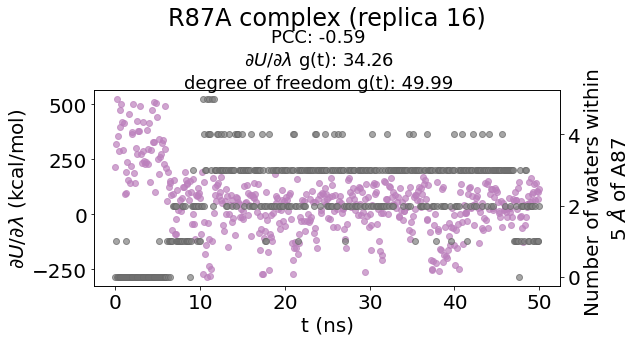

<Figure size 432x288 with 0 Axes>

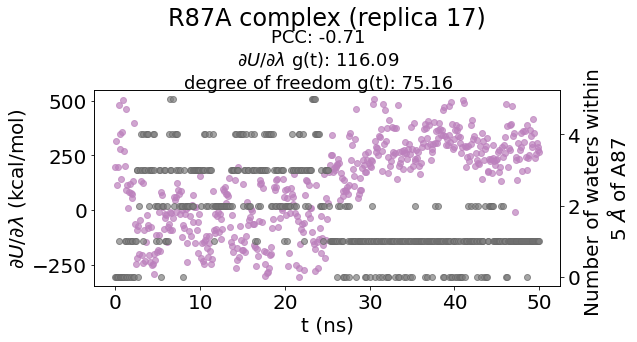

<Figure size 432x288 with 0 Axes>

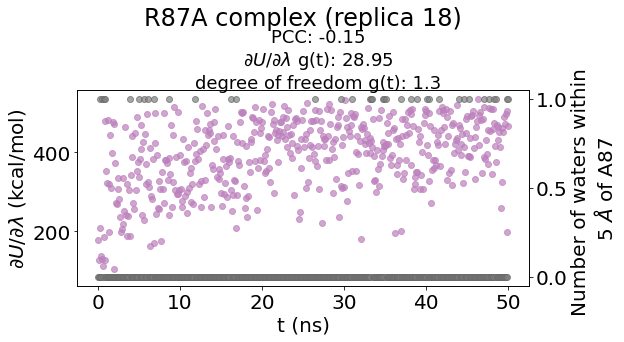

<Figure size 432x288 with 0 Axes>

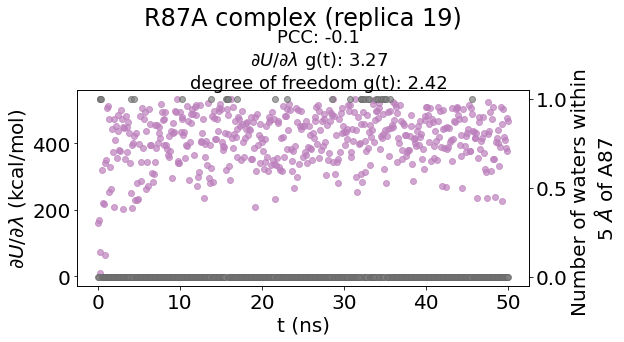

<Figure size 432x288 with 0 Axes>

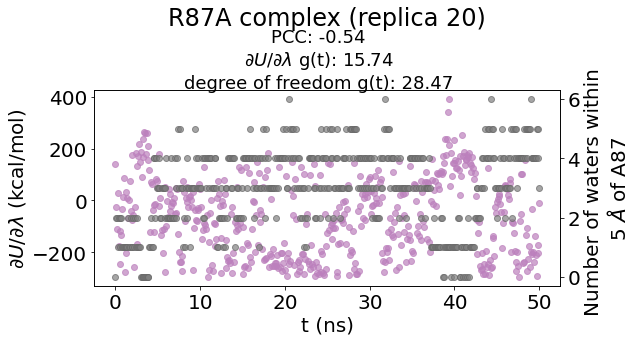

<Figure size 432x288 with 0 Axes>

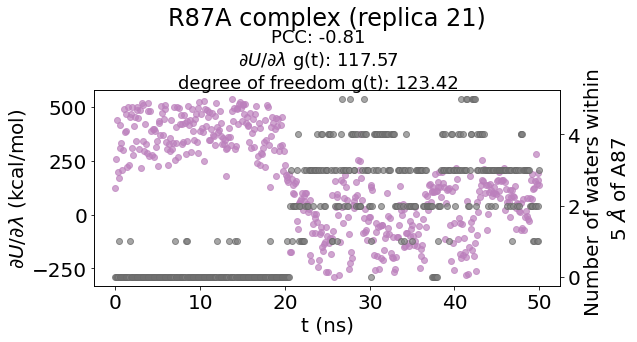

<Figure size 432x288 with 0 Axes>

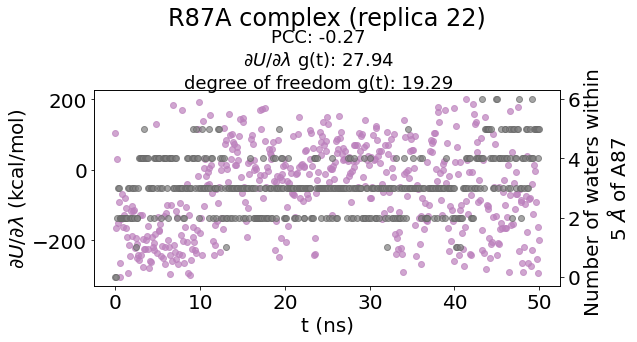

<Figure size 432x288 with 0 Axes>

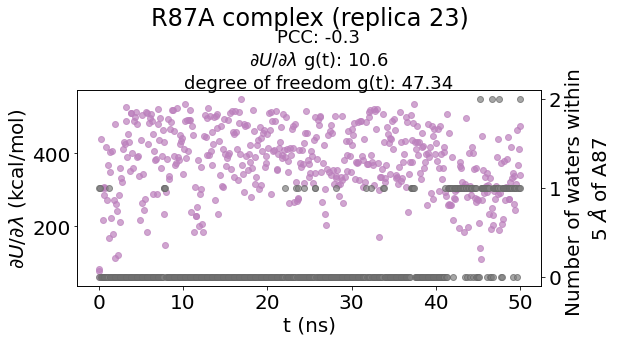

<Figure size 432x288 with 0 Axes>

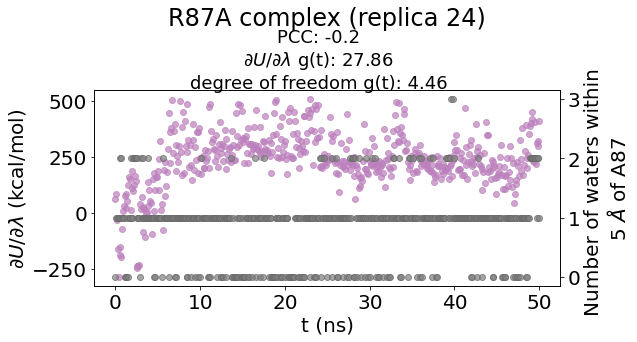

<Figure size 432x288 with 0 Axes>

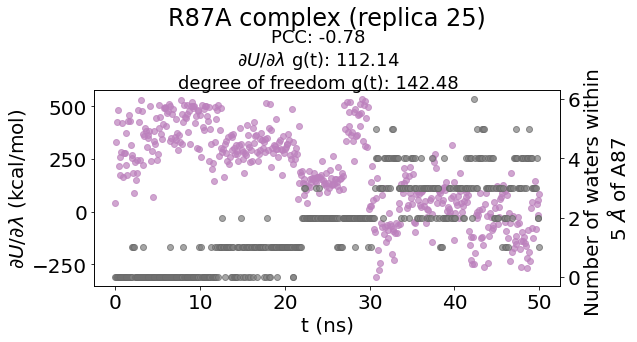

<Figure size 432x288 with 0 Axes>

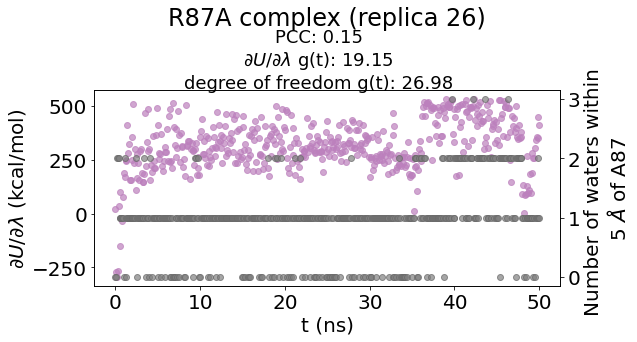

<Figure size 432x288 with 0 Axes>

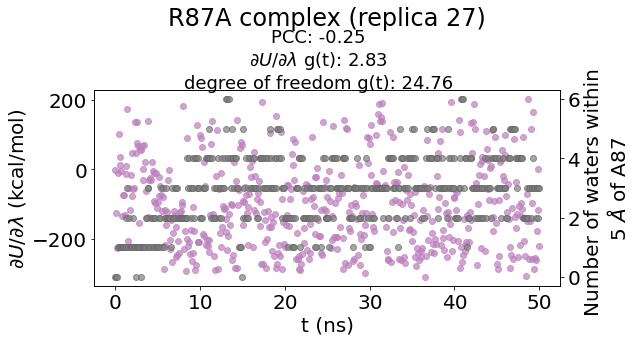

<Figure size 432x288 with 0 Axes>

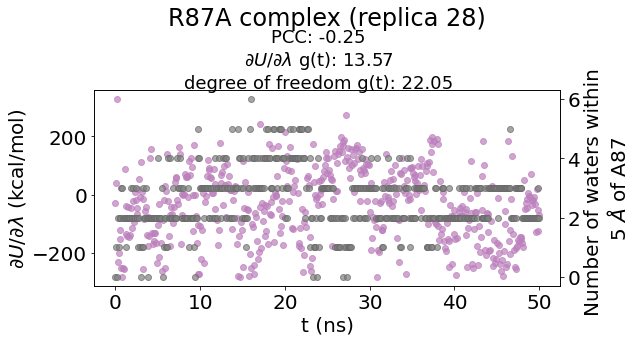

<Figure size 432x288 with 0 Axes>

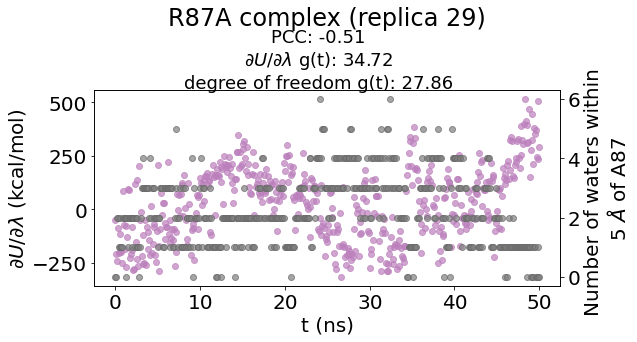

<Figure size 432x288 with 0 Axes>

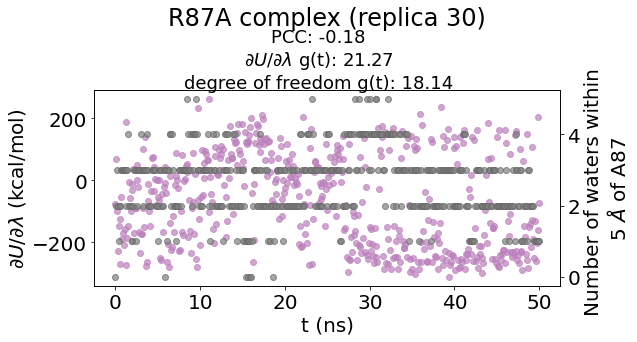

<Figure size 432x288 with 0 Axes>

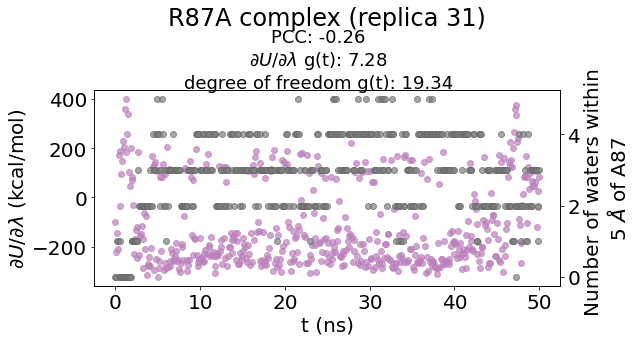

<Figure size 432x288 with 0 Axes>

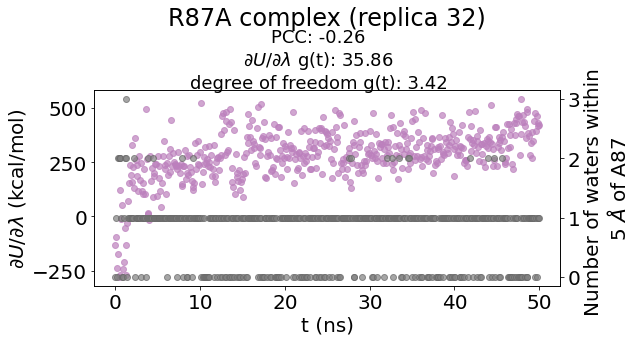

<Figure size 432x288 with 0 Axes>

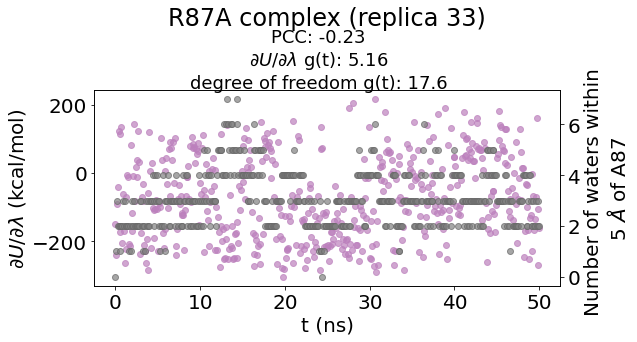

<Figure size 432x288 with 0 Axes>

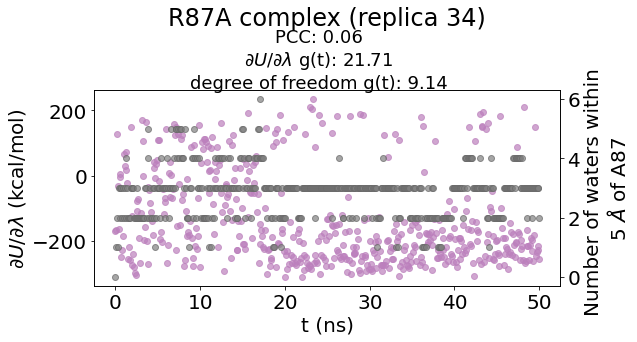

<Figure size 432x288 with 0 Axes>

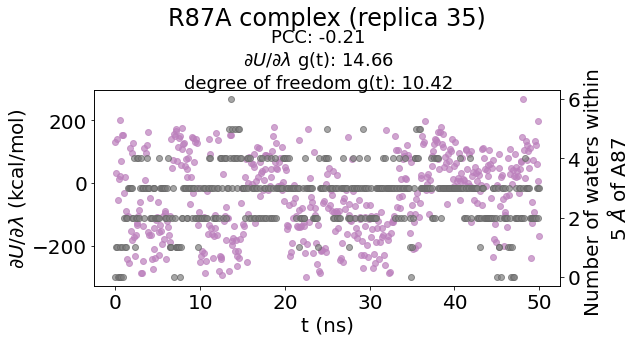

259.26


<Figure size 432x288 with 0 Axes>

In [35]:
# AREX
out_dir = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/45/10/replicate_1/"
sub_dir = 10
phase = "complex"
n_replicas = 36
mutation_name = 'R87A'
position_type = 'new'
checkpoint_interval_10 = True
figsize = (9.25, 4)
residue_label = 'A87'


with open(os.path.join(out_dir, "dataframe_waters_per_replica.pickle"), "rb") as f:
    df = pickle.load(f)

results = []
for replica in range(n_replicas):
    
    save_path = os.path.join(out_dir, f"correlation_waters_per_replica{replica}.pdf")

    
    result = plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,
                                           residue_label,
                                           is_water=True, 
                                           position_type=position_type,
                                           checkpoint_interval_10=checkpoint_interval_10,
                                           figsize=figsize,
                                           save_path=save_path)
    results.append(result)
    
print(round(timeseries.statisticalInefficiencyMultiple(results), 2))

### neighboring waters new (AREST)

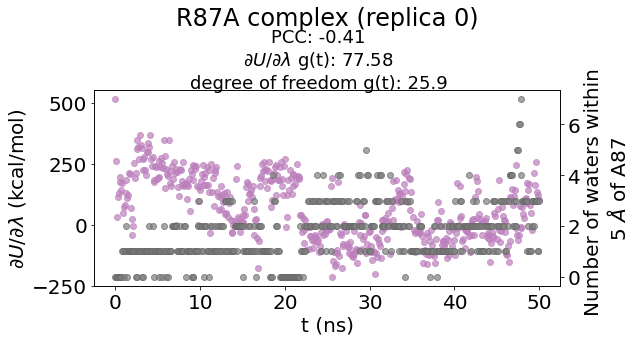

<Figure size 432x288 with 0 Axes>

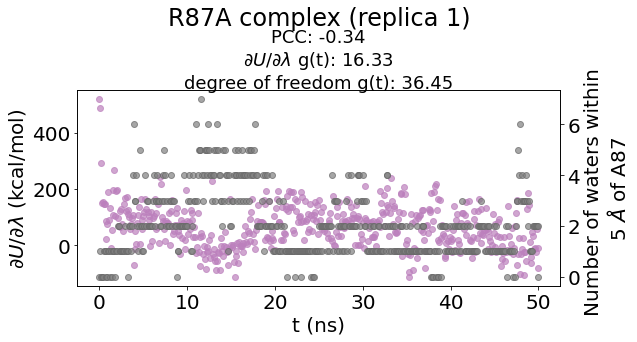

<Figure size 432x288 with 0 Axes>

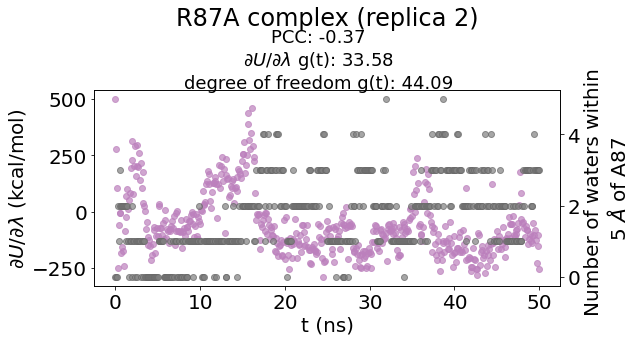

<Figure size 432x288 with 0 Axes>

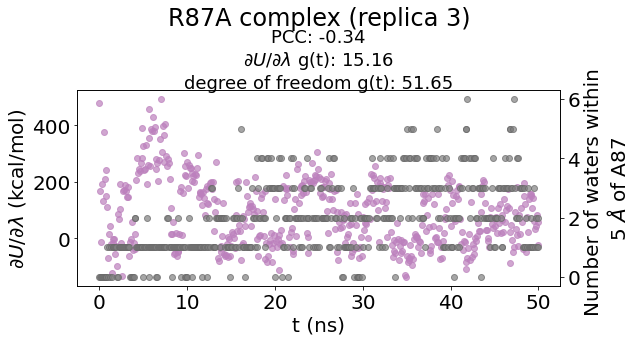

<Figure size 432x288 with 0 Axes>

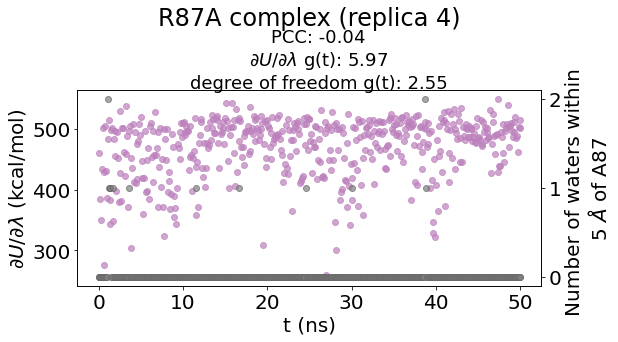

<Figure size 432x288 with 0 Axes>

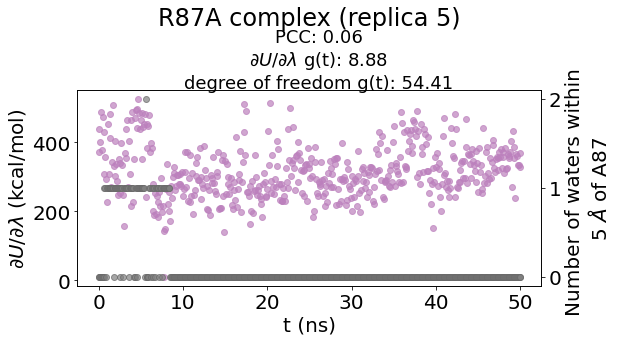

<Figure size 432x288 with 0 Axes>

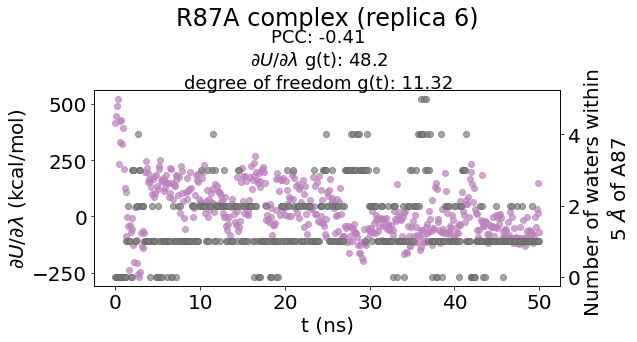

<Figure size 432x288 with 0 Axes>

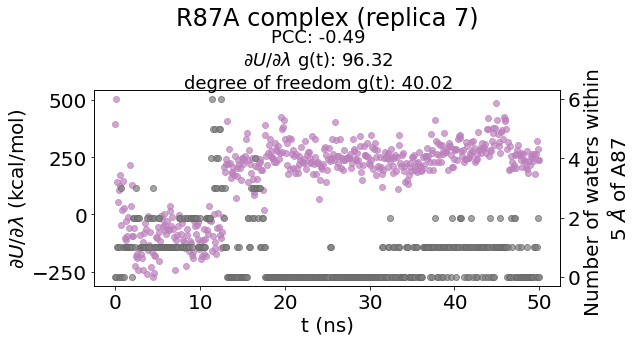

<Figure size 432x288 with 0 Axes>

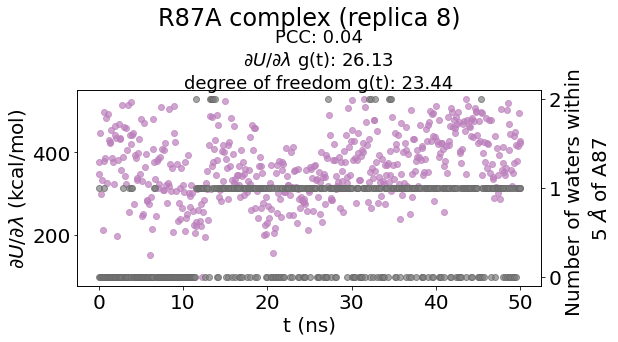

<Figure size 432x288 with 0 Axes>

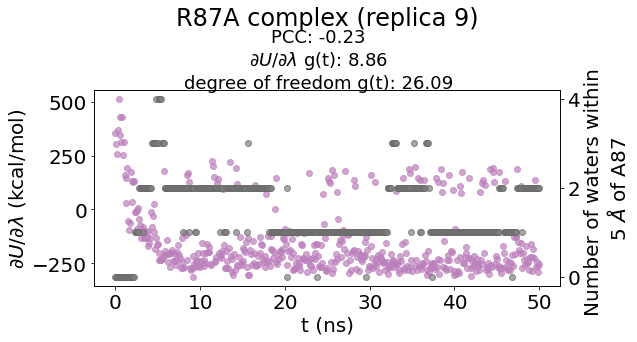

<Figure size 432x288 with 0 Axes>

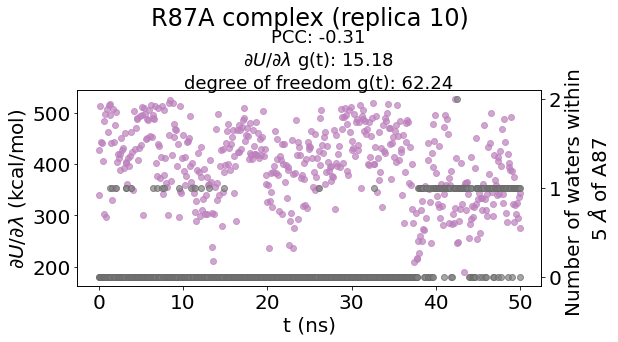

<Figure size 432x288 with 0 Axes>

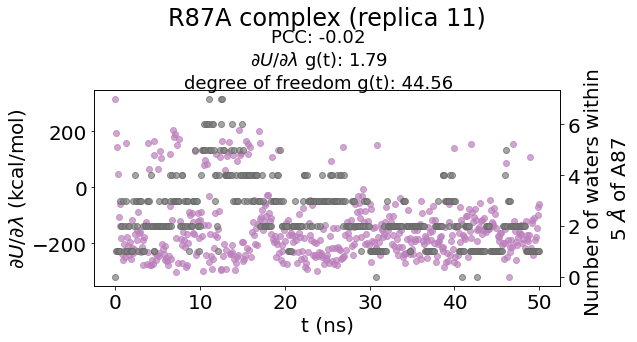

<Figure size 432x288 with 0 Axes>

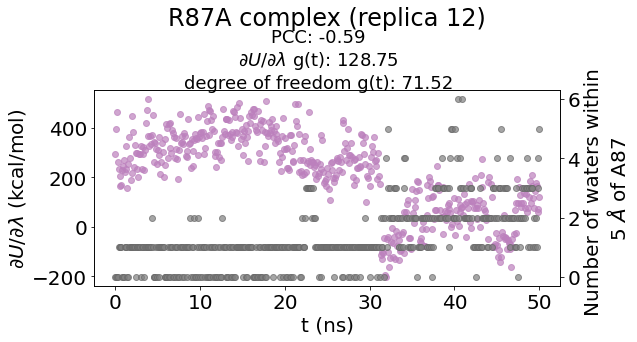

<Figure size 432x288 with 0 Axes>

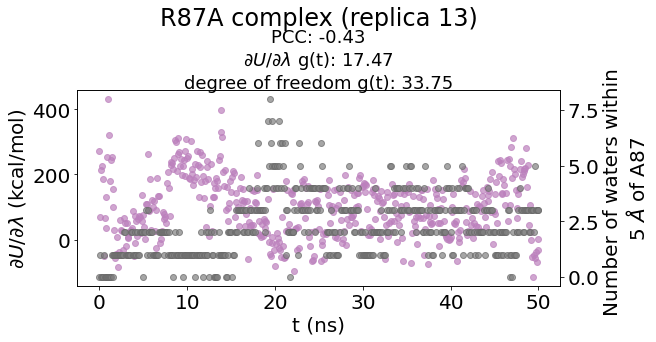

<Figure size 432x288 with 0 Axes>

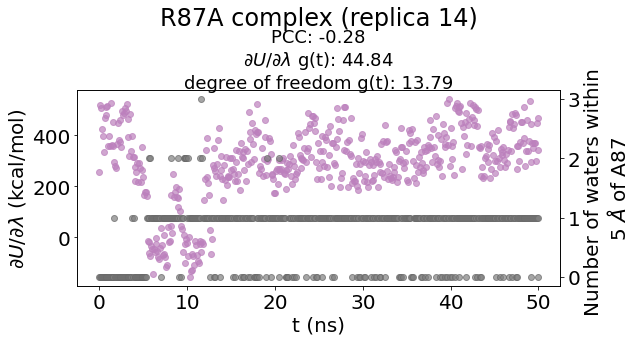

<Figure size 432x288 with 0 Axes>

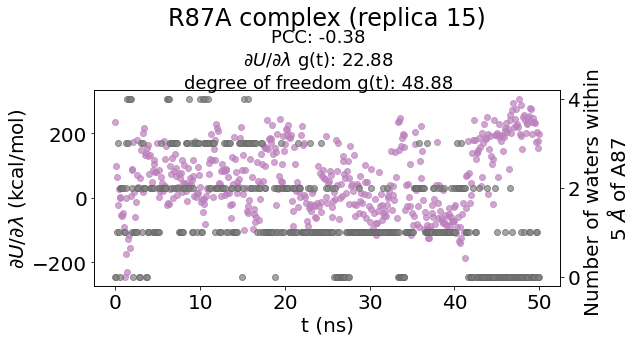

<Figure size 432x288 with 0 Axes>

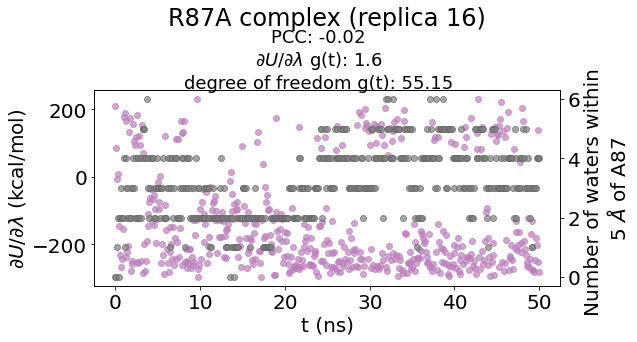

<Figure size 432x288 with 0 Axes>

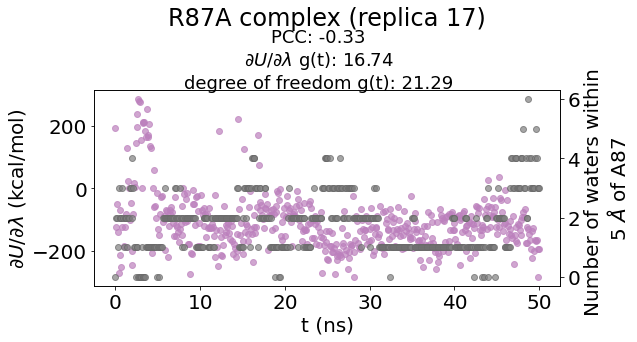

<Figure size 432x288 with 0 Axes>

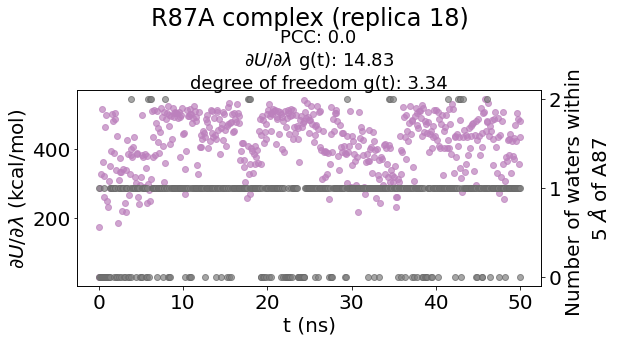

<Figure size 432x288 with 0 Axes>

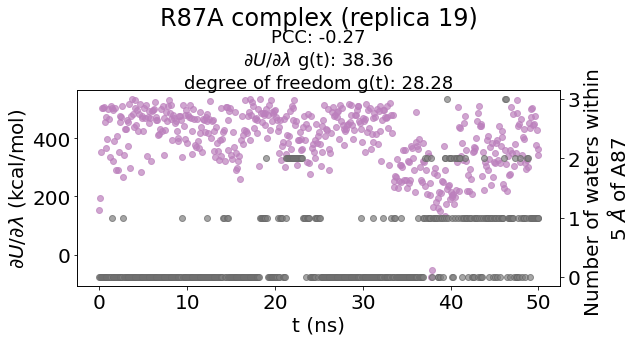

<Figure size 432x288 with 0 Axes>

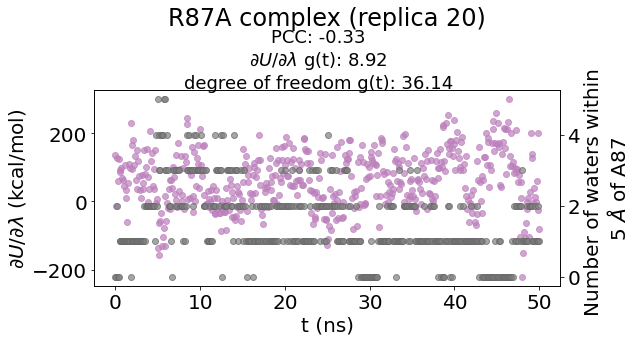

<Figure size 432x288 with 0 Axes>

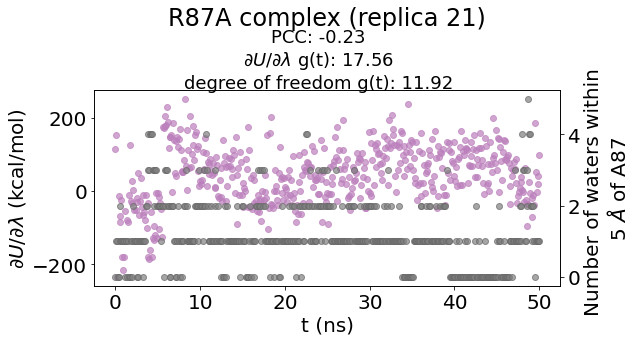

<Figure size 432x288 with 0 Axes>

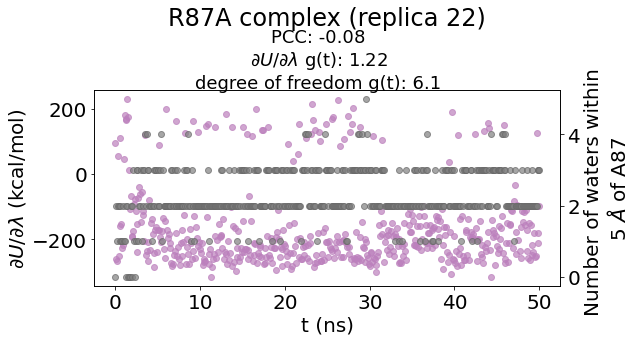

<Figure size 432x288 with 0 Axes>

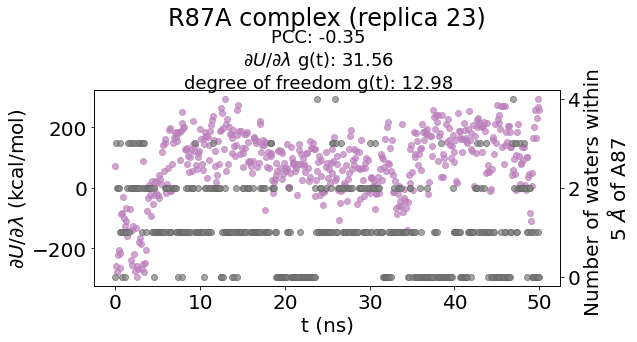

<Figure size 432x288 with 0 Axes>

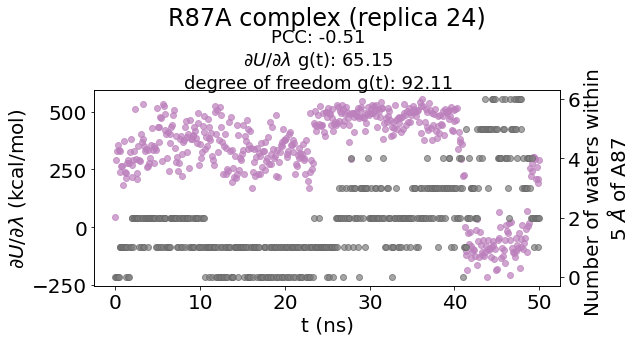

<Figure size 432x288 with 0 Axes>

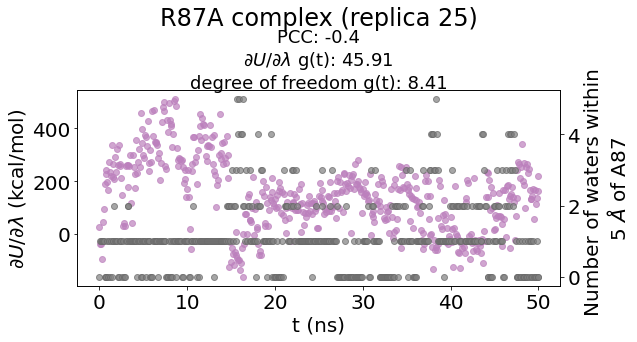

<Figure size 432x288 with 0 Axes>

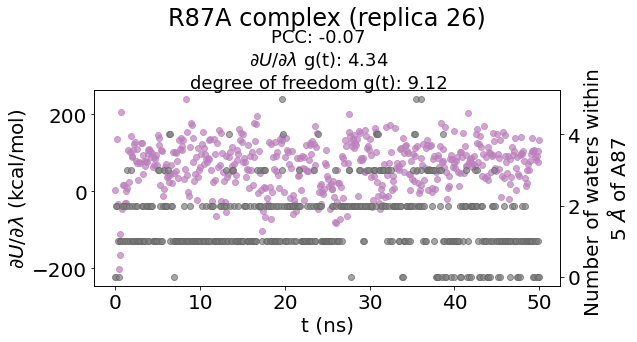

<Figure size 432x288 with 0 Axes>

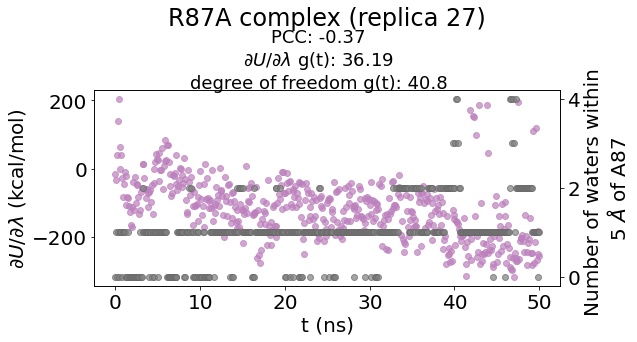

<Figure size 432x288 with 0 Axes>

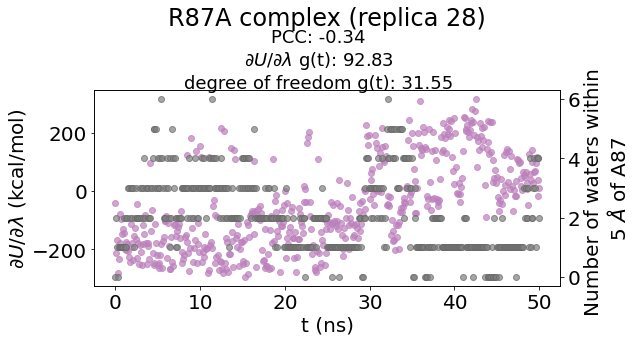

<Figure size 432x288 with 0 Axes>

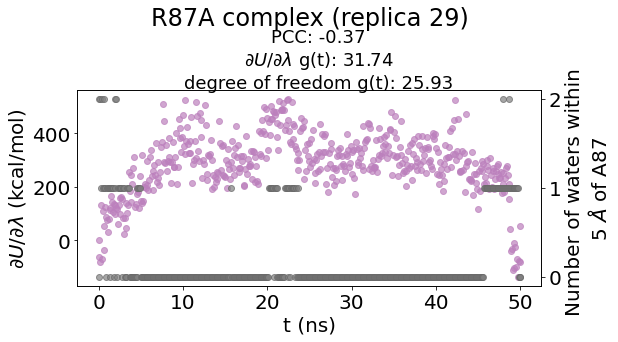

<Figure size 432x288 with 0 Axes>

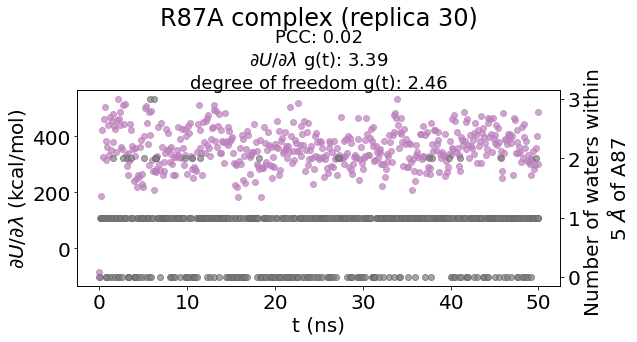

<Figure size 432x288 with 0 Axes>

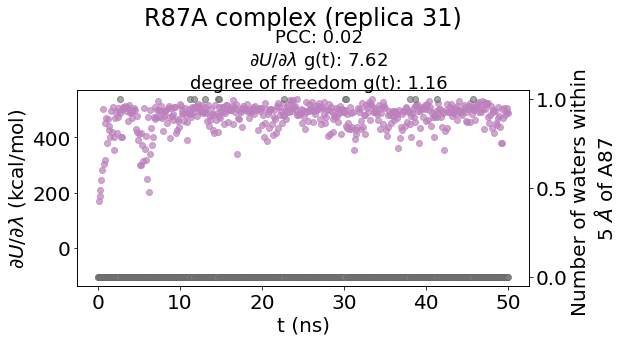

<Figure size 432x288 with 0 Axes>

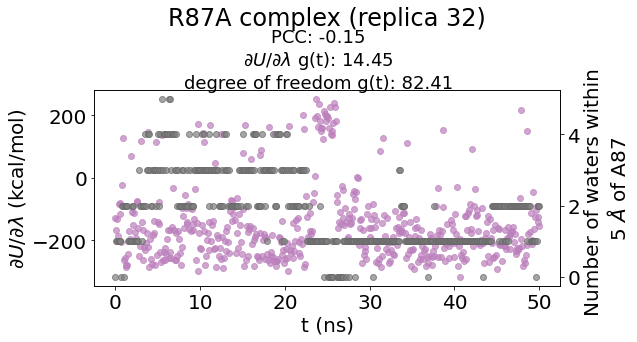

<Figure size 432x288 with 0 Axes>

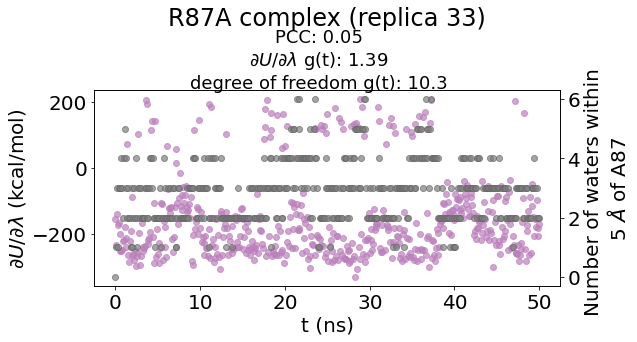

<Figure size 432x288 with 0 Axes>

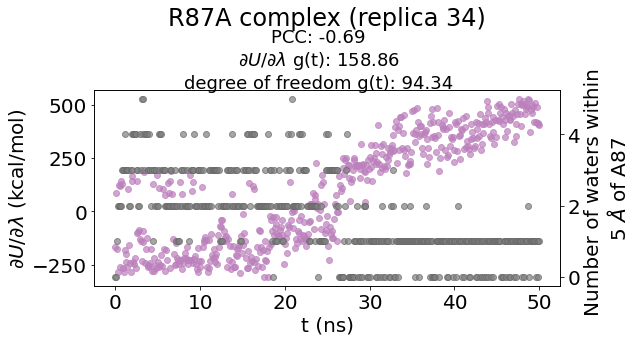

<Figure size 432x288 with 0 Axes>

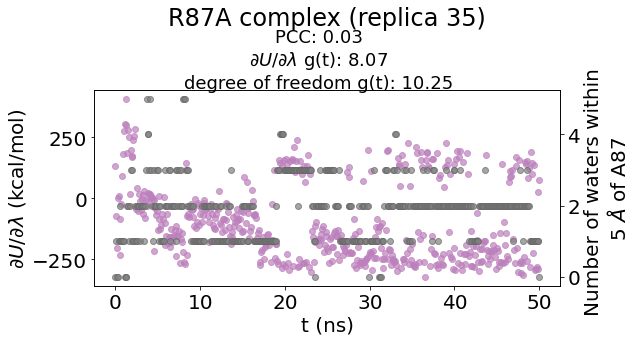

202.62


<Figure size 432x288 with 0 Axes>

In [36]:
# AREST
out_dir = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/52/12/replicate_0/"
sub_dir = 12
phase = "complex"
n_replicas = 36
mutation_name = 'R87A'
position_type = 'new'
checkpoint_interval_10 = True
figsize = (9.25, 4)
residue_label = 'A87'


with open(os.path.join(out_dir, "dataframe_waters_per_replica.pickle"), "rb") as f:
    df = pickle.load(f)

results = []
for replica in range(n_replicas):
    
    save_path = os.path.join(out_dir, f"correlation_waters_per_replica{replica}.pdf")

    
    result = plot_correlation_du_dlambda_vs_feature(out_dir, sub_dir, phase, replica, df, mutation_name,
                                           residue_label,
                                           is_water=True, 
                                           position_type=position_type,
                                           checkpoint_interval_10=checkpoint_interval_10,
                                           figsize=figsize,
                                           save_path=save_path)
    results.append(result)
    
print(round(timeseries.statisticalInefficiencyMultiple(results), 2))

### neighboring waters new (AREX vs AREST)

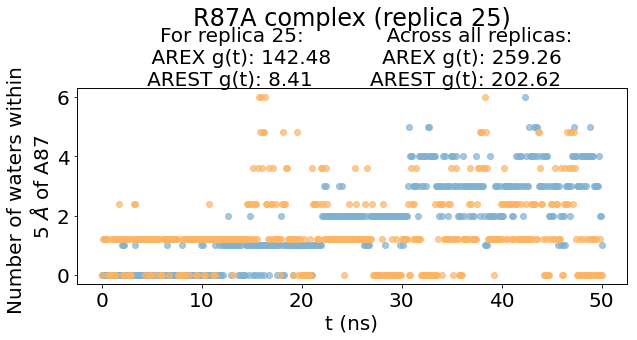

<Figure size 432x288 with 0 Axes>

In [37]:
# AREX vs AREST replica 25
out_dir_AREX = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/45/10/replicate_1/"
out_dir_AREST = "/data/chodera/zhangi/perses_benchmark/repex/perses-bnbs-paper-fourth-attempt/52/12/replicate_0/"
phase = "complex"
n_replicas = 36
mutation_name = 'R87A'
position_type = 'new'
checkpoint_interval_10 = True
figsize = (9.25, 4)
residue_label = 'A87'

replica = 25

with open(os.path.join(out_dir_AREX, f"dataframe_waters_per_replica.pickle"), "rb") as f:
    df_AREX = pickle.load(f)

with open(os.path.join(out_dir_AREST, f"dataframe_waters_per_replica.pickle"), "rb") as f:
    df_AREST = pickle.load(f)

save_path = os.path.join(out_dir_AREST, f"AREX_vs_AREST_waters_per_replica{replica}.pdf")

plot_feature_vs_feature(phase, replica, df_AREX, df_AREST,
                           mutation_name,
                           residue_label,
                           g_t_AREX_all=259.26,
                           g_t_AREST_all=202.62,
                           is_water=True,
                           position_type=position_type, 
                           checkpoint_interval_10=checkpoint_interval_10,
                           figsize=figsize,
                           save_path=save_path)